<a href="https://colab.research.google.com/github/HowardHNguyen/ML_DL_Time_Series_by_Python/blob/main/Influenza_like_Illness_Forecasting_ARIMA_SARIMA_FBProphet_Neural_Prophet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Description:

The California Department of Public Health (CDPH) Influenza Surveillance Program (CISP) is a collaborative effort between CDPH, the Centers for Disease Control and Prevention (CDC), Kaiser Permanente, California local health jurisdictions and the participating California sentinel providers and sentinel laboratories. Influenza surveillance in California is particularly important due to its coastal location with several ports of entry for flights and shipping from Asia. Annual influenza epidemics follow a winter seasonal pattern in the United States with typical activity peaking during late December to early February. CDPH obtains and analyzes clinical, and laboratory data year-round in an effort to determine the timing and impact of influenza activity and to determine how well circulating strains of the virus match those used in the current influenza vaccines.

Influenza surveillance season: Influenza surveillance seasons run from Week 40 through Week 39.
Values include:
2001-2002, 2002-2003, 2003-2004, 2004-2005, 2005-2006, 2006-2007, 2007-2008, 2008-2009, 2009-2010, 2010-2011, 2011-2012, 2012-2013, 2013-2014, 2014-2015, 2015-2016, 2016-2017, 2017-2018, 2018-2019, 2019-2020.

Weekending: Date of the last day included in the CDC MMWR Week (Saturday). Format MM/DD/YYYY.

# Region

Values:

**Bay Area:**  Includes Alameda, Contra Costa, Marin, Napa, San Francisco, San Mateo, Santa Clara, Santa Cruz, Solano, and Sonoma counties
California: All California counties

**Central:** Includes Calaveras, Fresno, Inyo, Kings, Madera, Mariposa, Merced, Mono, Monterey, San Benito, San Joaquin, Stanislaus, Tulare, and Tuolumne counties

**Lower Southern:** Includes Imperial, Orange, Riverside, San Bernardino, and San Diego counties

**Northern:** Includes Alpine, Amador, Butte, Colusa, Del Norte, El Dorado, Glenn, Humboldt, Lake, Lassen, Mendocino, Modoc, Nevada, Placer, Plumas, Sacramento, Shasta, Sierra, Siskiyou, Sutter, Tehama, Trinity, Yolo, and Yuba counties

**Upper Southern:** Includes Kern, Los Angeles, San Luis Obispo, Santa Barbara, and Ventura counties

Note: Not all counties in region have outpatient ILI data providers. View the [California Regional Map](https://cceanet.org/about-us/regions/).

# Columns Description:

**Season**:
Influenza surveillance season: Influenza surveillance seasons run from Week 40 through Week 39. (text)

**Weekending**:
Date of the last day included in the CDC MMWR Week (Saturday). Format MM/DD/YYYY. (number)

**Total_ILI**:
Number of outpatient visits for influenza-like illness (ILI). (number)

**Total_Patients_Seen**:
Total patients seen for any reason. (number)

**Percent_ILI**:
Percentage of patients that were due to influenza-like illness. (number)

**Number_Providers_Reporting**:
Number of providers reporting data during given week and region. (number)

# Load and Preprocess the Data:

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'])

# Set the index to weekending
df.set_index('weekending', inplace=True)

# Filter data for each region
regions = df['region'].unique()
region_data = {region: df[df['region'] == region]['Total_ILI'] for region in regions}

WARNING - (py.warnings._showwarnmsg) - <ipython-input-5-e54fa5e9ed97>:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['weekending'] = pd.to_datetime(df['weekending'])

  df['weekending'] = pd.to_datetime(df['weekending'])



In [6]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

In [7]:
df.head()

,season,date_code,region,Total_ILI,Total_Patients_Seen,Percent_ILI,Number_Providers_Reporting
weekending,,,,,,,
2001-10-06,2001-2002,200140,Bay Area,3,135,2.22,2
2001-10-06,2001-2002,200140,California,25,1211,2.06,14
2001-10-06,2001-2002,200140,Central,0,0,0.00,0
2001-10-06,2001-2002,200140,Lower Southern,2,336,0.60,4
2001-10-06,2001-2002,200140,Northern,20,529,3.78,4


# EDA

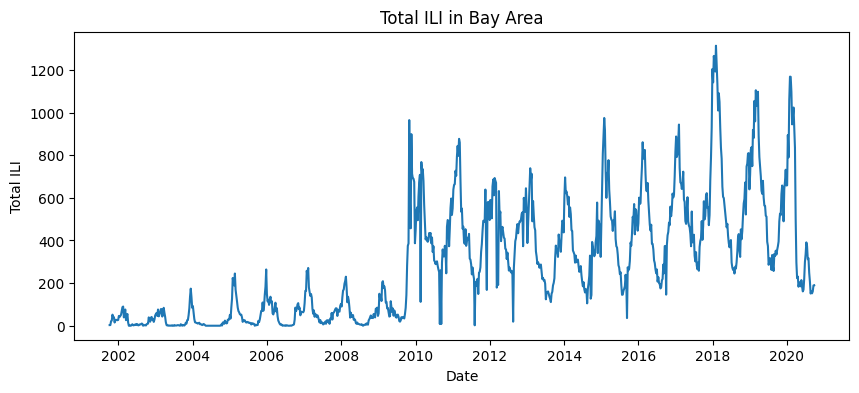

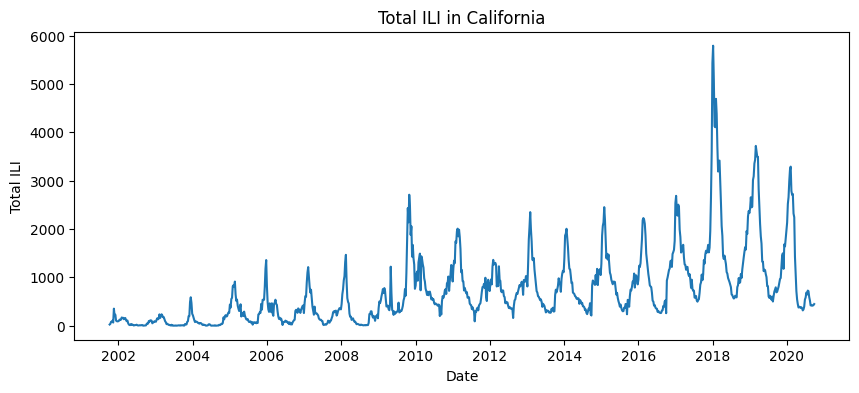

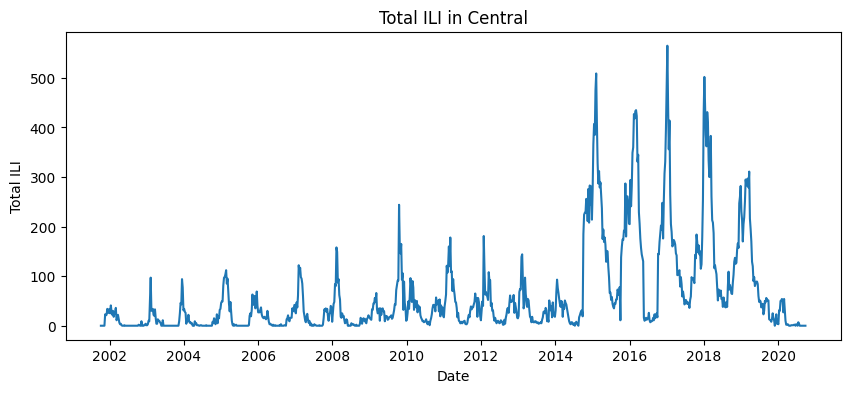

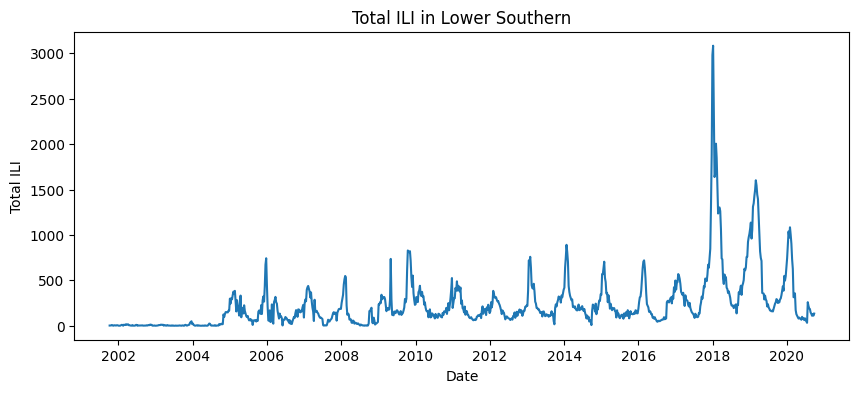

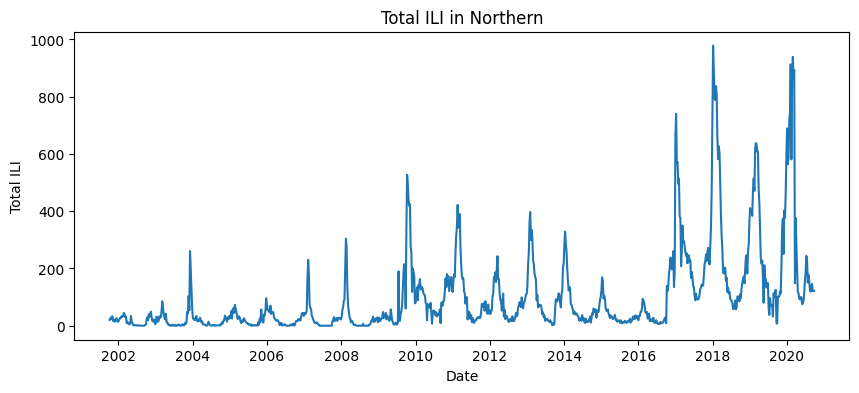

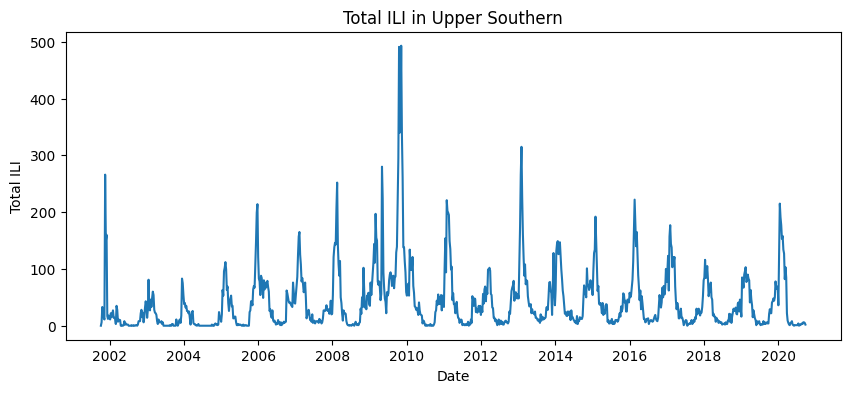

In [8]:
import matplotlib.pyplot as plt

for region, data in region_data.items():
    plt.figure(figsize=(10, 4))
    plt.plot(data)
    plt.title(f'Total ILI in {region}')
    plt.xlabel('Date')
    plt.ylabel('Total ILI')
    plt.show()

# **ARIMA Model Implementation**
We'll apply the ARIMA model to each region's data

**Parameters with ACF and PACF**

WARNING - (py.warnings._showwarnmsg) - <ipython-input-9-3e530dd3a6fe>:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['weekending'] = pd.to_datetime(df['weekending'])

  df['weekending'] = pd.to_datetime(df['weekending'])



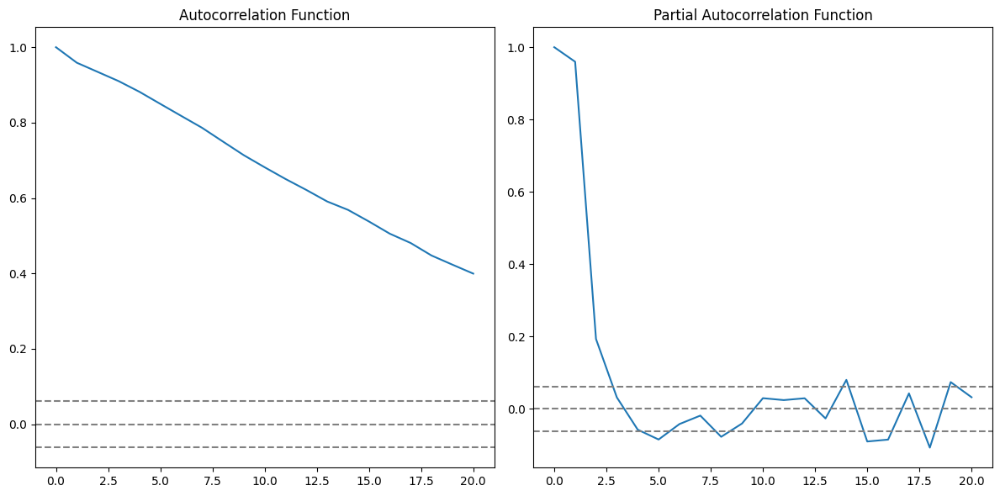

In [9]:
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import acf, pacf
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')
df['weekending'] = pd.to_datetime(df['weekending'])
df.set_index('weekending', inplace=True)

# Example: Choose one region
region_data = df[df['region'] == 'Bay Area']['Total_ILI']

# Plot ACF and PACF
plt.figure(figsize=(12, 6))

# ACF
plt.subplot(121)
plt.plot(acf(region_data, nlags=20))
plt.title('Autocorrelation Function')
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=1.96/np.sqrt(len(region_data)), linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(region_data)), linestyle='--', color='gray')

# PACF
plt.subplot(122)
plt.plot(pacf(region_data, nlags=20))
plt.title('Partial Autocorrelation Function')
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=1.96/np.sqrt(len(region_data)), linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(region_data)), linestyle='--', color='gray')

plt.tight_layout()
plt.show()

Test on ARIMA model with parameters 1,1,0

WARNING - (py.warnings._showwarnmsg) - <ipython-input-10-c778b793bed8>:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['weekending'] = pd.to_datetime(df['weekending'])

  df['weekending'] = pd.to_datetime(df['weekending'])

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-pack

                               SARIMAX Results                                
Dep. Variable:              Total_ILI   No. Observations:                  991
Model:                 ARIMA(1, 1, 0)   Log Likelihood               -5711.384
Date:                Fri, 17 May 2024   AIC                          11426.767
Time:                        18:49:27   BIC                          11436.563
Sample:                    10-06-2001   HQIC                         11430.492
                         - 09-26-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2079      0.014    -14.897      0.000      -0.235      -0.181
sigma2      6010.3400    102.289     58.759      0.000    5809.857    6210.822
Ljung-Box (L1) (Q):                   0.09   Jarque-

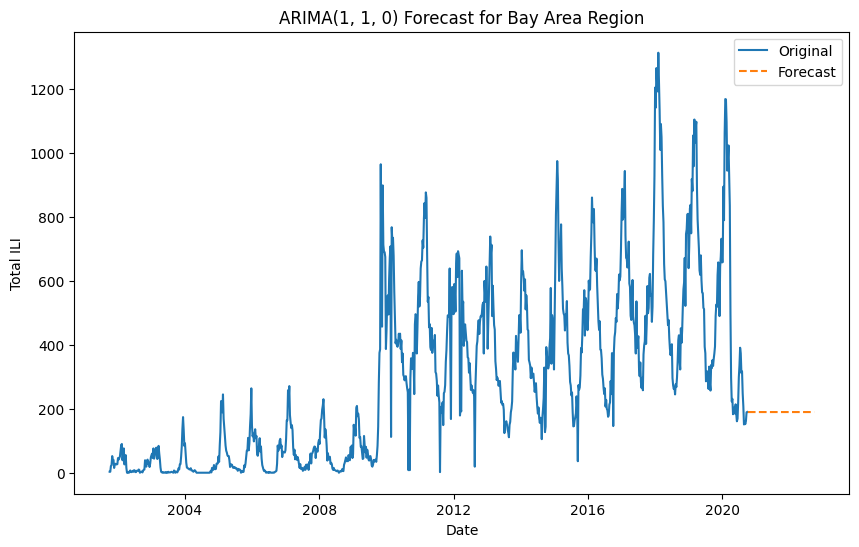

In [10]:
from statsmodels.tsa.arima.model import ARIMA
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')
df['weekending'] = pd.to_datetime(df['weekending'])
df.set_index('weekending', inplace=True)

# Example data for the Upper Southern region
region_data = df[df['region'] == 'Bay Area']['Total_ILI']

# ARIMA(1, 1, 0)
model_110 = ARIMA(region_data, order=(1, 1, 0))
model_fit_110 = model_110.fit()
print(model_fit_110.summary())

# Forecast
steps = 104
forecast_110 = model_fit_110.forecast(steps=steps)

# Plot the forecast
plt.figure(figsize=(10, 6))
plt.plot(region_data, label='Original')
plt.plot(forecast_110, label='Forecast', linestyle='--')
plt.title('ARIMA(1, 1, 0) Forecast for Bay Area Region')
plt.xlabel('Date')
plt.ylabel('Total ILI')
plt.legend()
plt.show()

# FORECAST
The 'fit_arima_forecast' function provides the forecast for each region.

# Prediction for 5 years

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'])

# Set the index to weekending
df.set_index('weekending', inplace=True)

# Filter data for each region
regions = df['region'].unique()
region_data = {region: df[df['region'] == region]['Total_ILI'] for region in regions}

WARNING - (py.warnings._showwarnmsg) - <ipython-input-11-82a2b884156f>:11: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['weekending'] = pd.to_datetime(df['weekending'])

  df['weekending'] = pd.to_datetime(df['weekending'])



In [12]:
# Function to fit ARIMA model and forecast with parameter 1,1,1
def fit_arima_forecast(data, order=(1,1,1), steps=200):
    train_size = int(len(data) * 0.8)
    train, test = data[:train_size], data[train_size:]

    # Fit the model
    model = ARIMA(train, order=order)
    model_fit = model.fit()

    # Forecast
    forecast = model_fit.forecast(steps=len(test))

    # Calculate error metrics
    mae = mean_absolute_error(test, forecast)
    mse = mean_squared_error(test, forecast)
    rmse = np.sqrt(mse)

    # Full forecast
    full_forecast = model_fit.forecast(steps=steps)

    return full_forecast, mae, mse, rmse

In [13]:
# Apply ARIMA to each region
arima_order = (1, 1, 1)

forecasts = {}
error_metrics = {}
for region, data in region_data.items():
    full_forecast, mae, mse, rmse = fit_arima_forecast(data, order=arima_order)
    forecasts[region] = full_forecast
    error_metrics[region] = {'MAE': mae, 'MSE': mse, 'RMSE': rmse}

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was pr

Forecast for Bay Area:
2016-12-10    593.602883
2016-12-17    592.824192
2016-12-24    592.801222
2016-12-31    592.800544
2017-01-07    592.800524
                 ...    
2020-09-05    592.800524
2020-09-12    592.800524
2020-09-19    592.800524
2020-09-26    592.800524
2020-10-03    592.800524
Freq: W-SAT, Name: predicted_mean, Length: 200, dtype: float64
Error Metrics for Bay Area:
MAE: 233.43713307483853
MSE: 79557.75296906629
RMSE: 282.05983934099214


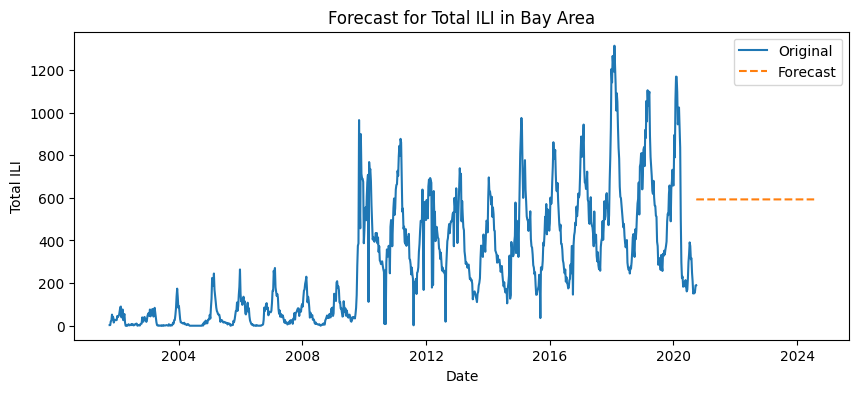

Forecast for California:
2016-12-10    1495.124585
2016-12-17    1502.717900
2016-12-24    1507.473397
2016-12-31    1510.451643
2017-01-07    1512.316841
                 ...     
2020-09-05    1515.442463
2020-09-12    1515.442463
2020-09-19    1515.442463
2020-09-26    1515.442463
2020-10-03    1515.442463
Freq: W-SAT, Name: predicted_mean, Length: 200, dtype: float64
Error Metrics for California:
MAE: 835.2610207401071
MSE: 1160572.0253345328
RMSE: 1077.2984847917187


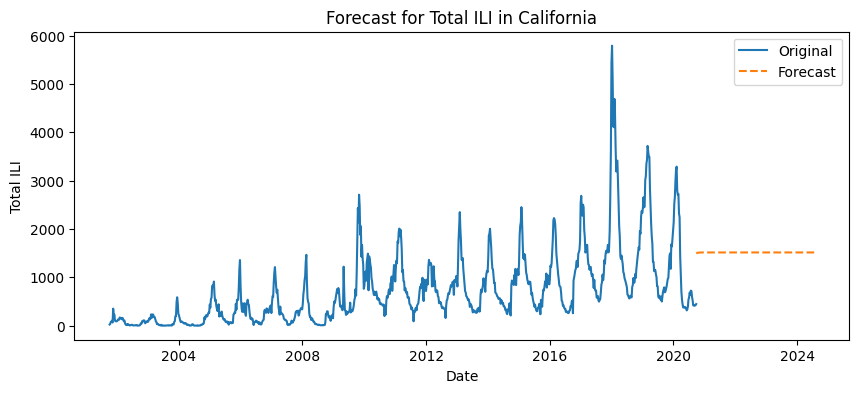

Forecast for Central:
2016-12-10    232.520177
2016-12-17    242.380473
2016-12-24    237.389389
2016-12-31    239.915776
2017-01-07    238.636969
                 ...    
2020-09-05    239.066736
2020-09-12    239.066736
2020-09-19    239.066736
2020-09-26    239.066736
2020-10-03    239.066736
Freq: W-SAT, Name: predicted_mean, Length: 200, dtype: float64
Error Metrics for Central:
MAE: 156.43906925344191
MSE: 29168.636371208147
RMSE: 170.78827937305343


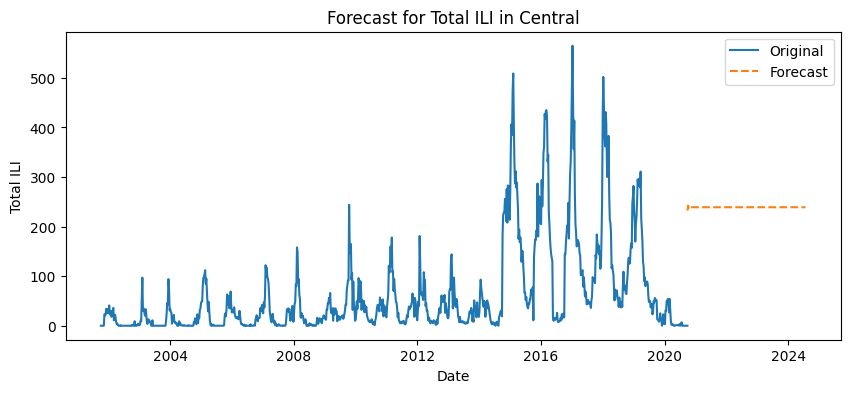

Forecast for Lower Southern:
2016-12-10    335.312798
2016-12-17    324.138026
2016-12-24    334.279956
2016-12-31    325.075407
2017-01-07    333.429214
                 ...    
2020-09-05    329.454691
2020-09-12    329.454691
2020-09-19    329.454691
2020-09-26    329.454691
2020-10-03    329.454691
Freq: W-SAT, Name: predicted_mean, Length: 200, dtype: float64
Error Metrics for Lower Southern:
MAE: 331.96799981191026
MSE: 299340.43523028
RMSE: 547.1201287014397


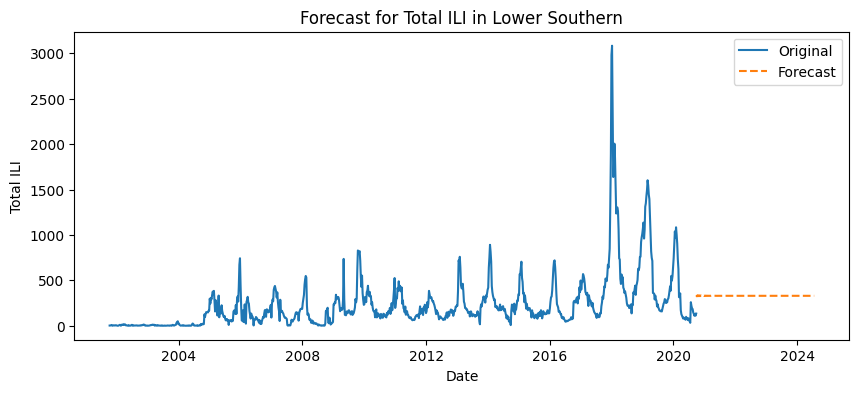

Forecast for Northern:
2016-12-10    217.753623
2016-12-17    217.917829
2016-12-24    217.808389
2016-12-31    217.881329
2017-01-07    217.832715
                 ...    
2020-09-05    217.852157
2020-09-12    217.852157
2020-09-19    217.852157
2020-09-26    217.852157
2020-10-03    217.852157
Freq: W-SAT, Name: predicted_mean, Length: 200, dtype: float64
Error Metrics for Northern:
MAE: 162.53415176283272
MSE: 54100.55860160248
RMSE: 232.59526779709532


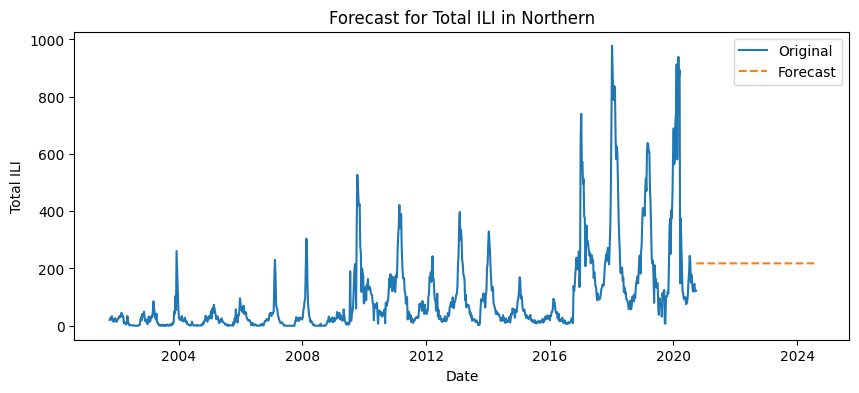

Forecast for Upper Southern:
2016-12-10    67.241474
2016-12-17    64.812551
2016-12-24    62.673849
2016-12-31    60.790690
2017-01-07    59.132542
                ...    
2020-09-05    46.913272
2020-09-12    46.913272
2020-09-19    46.913272
2020-09-26    46.913272
2020-10-03    46.913272
Freq: W-SAT, Name: predicted_mean, Length: 200, dtype: float64
Error Metrics for Upper Southern:
MAE: 37.72507423125461
MSE: 1989.7149200004103
RMSE: 44.606220642421725


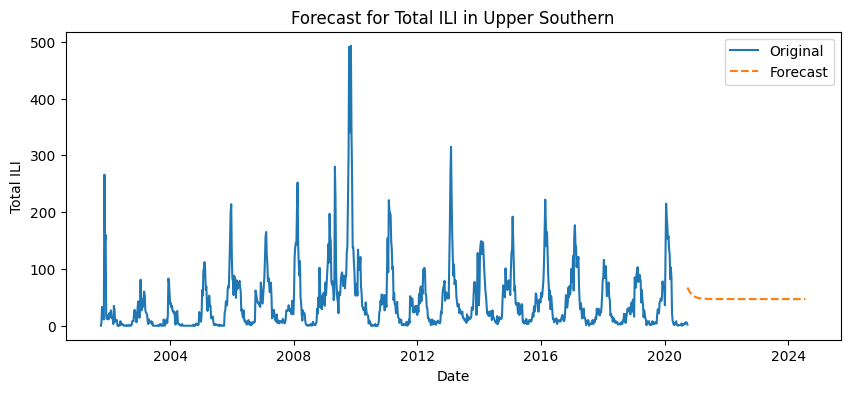

In [14]:
# Display the forecasts and error metrics
for region, forecast in forecasts.items():
    print(f'Forecast for {region}:')
    print(forecast)

    print(f'Error Metrics for {region}:')
    print(f"MAE: {error_metrics[region]['MAE']}")
    print(f"MSE: {error_metrics[region]['MSE']}")
    print(f"RMSE: {error_metrics[region]['RMSE']}")

    plt.figure(figsize=(10, 4))
    plt.plot(region_data[region], label='Original')
    plt.plot(pd.date_range(start=region_data[region].index[-1], periods=200, freq='W'), forecast, label='Forecast', linestyle='--')
    plt.title(f'Forecast for Total ILI in {region}')
    plt.xlabel('Date')
    plt.ylabel('Total ILI')
    plt.legend()
    plt.show()

The forecast results indicate that the ARIMA model's predictions for these regions are not aligning well with the observed data, as suggested by the high error metrics (MAE, MSE, RMSE) and the forecast plot showing a flat future trend. Here are a few suggestions to improve the ARIMA model's performance:

# Parameter Tuning
The ARIMA model parameters (p, d, q) need to be tuned carefully. The current parameters (1, 1, 1) might not be the best fit.

We can use a **grid search** to find optimal parameters.

In [15]:
from statsmodels.tsa.arima.model import ARIMA
import itertools

# Define the p, d, and q parameters to take any value between 0 and 5
p = d = q = range(0, 6)
# Generate all different combinations of p, d, and q triplets
pdq = list(itertools.product(p, d, q))

# Define a function to find the best ARIMA model
def find_best_arima_model(data):
    best_aic = float("inf")
    best_pdq = None
    for param in pdq:
        try:
            temp_model = ARIMA(data, order=param)
            results = temp_model.fit()
            if results.aic < best_aic:
                best_aic = results.aic
                best_pdq = param
        except:
            continue
    return best_pdq

# Find the best ARIMA parameters for each region
best_pdq = {}
for region, data in region_data.items():
    best_pdq[region] = find_best_arima_model(data)
    print(f'Best ARIMA parameters for {region}: {best_pdq[region]}')

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was pr

Best ARIMA parameters for Bay Area: (3, 1, 5)


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA p

Best ARIMA parameters for California: (1, 0, 5)


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was pr

Best ARIMA parameters for Central: (5, 3, 4)


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA p

Best ARIMA parameters for Lower Southern: (0, 5, 4)


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was pr

Best ARIMA parameters for Northern: (0, 5, 4)


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SAT will be used.
  self._init_dates(dates, freq)

  self._init_dates(dates, freq)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was pr

Best ARIMA parameters for Upper Southern: (5, 1, 4)


# **Best ARIMA parameters for **
- Bay Area 315,
- California 105,
- Central 534,
- Lower southern, northern 054,
- Upper southern 514



# Seasonal ARIMA (SARIMA)
As our data shows seasonality, a seasonal ARIMA model might be more appropriate. We can use the seasonal_order parameter to model seasonality.

In [96]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Define the SARIMA model
def fit_sarima_forecast(data, order=(0,1,2), seasonal_order=(1,1,1,52), steps=260):
    train_size = int(len(data) * 0.8)
    train, test = data[:train_size], data[train_size:]

    # Fit the model
    model = SARIMAX(train, order=order, seasonal_order=seasonal_order)
    model_fit = model.fit(disp=False)

    # Forecast
    forecast = model_fit.forecast(steps=len(test))

    # Calculate error metrics
    mae = mean_absolute_error(test, forecast)
    mse = mean_squared_error(test, forecast)
    rmse = np.sqrt(mse)

    # Full forecast
    full_forecast = model_fit.forecast(steps=steps)

    return full_forecast, mae, mse, rmse

In [97]:
# Apply SARIMA to each region
sarima_order = (0, 1, 2)  # sarima order, we might want to tune this if needed
seasonal_order = (1, 1, 1, 52)  # seasonal order, we might want to tune this if needed

forecasts = {}
error_metrics = {}
for region, data in region_data.items():
    full_forecast, mae, mse, rmse = fit_sarima_forecast(data, order=sarima_order, seasonal_order=seasonal_order)
    forecasts[region] = full_forecast
    error_metrics[region] = {'MAE': mae, 'MSE': mse, 'RMSE': rmse}

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



No frequency information was provided, so inferred frequency W-SAT will be used.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



No frequency information was provided, so inferred frequency W-SAT will be used.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



No frequency information was provided, so inferred frequency W-SAT will be used.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/

Forecast for Bay Area:
2016-12-10    607.751426
2016-12-17    574.220646
2016-12-24    550.893540
2016-12-31    596.158466
2017-01-07    637.310728
                 ...    
2021-10-30    689.210311
2021-11-06    724.966016
2021-11-13    698.496097
2021-11-20    687.176755
2021-11-27    742.158019
Freq: W-SAT, Name: predicted_mean, Length: 260, dtype: float64
Error Metrics for Bay Area:
MAE: 162.53762700589525
MSE: 45715.27506580574
RMSE: 213.81130715143607


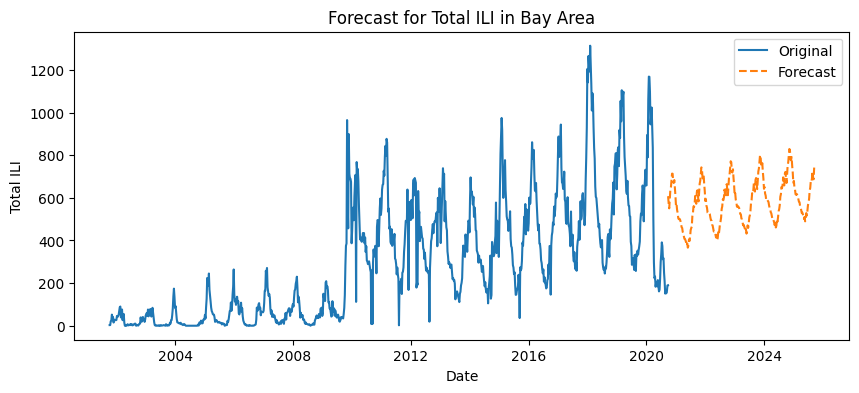

Forecast for California:
2016-12-10    1484.838020
2016-12-17    1406.815256
2016-12-24    1363.292612
2016-12-31    1465.760156
2017-01-07    1630.799286
                 ...     
2021-10-30    1810.041366
2021-11-06    1823.833474
2021-11-13    1774.949112
2021-11-20    1791.488602
2021-11-27    1894.473421
Freq: W-SAT, Name: predicted_mean, Length: 260, dtype: float64
Error Metrics for California:
MAE: 610.5568271043755
MSE: 774585.0477279008
RMSE: 880.1051344742291


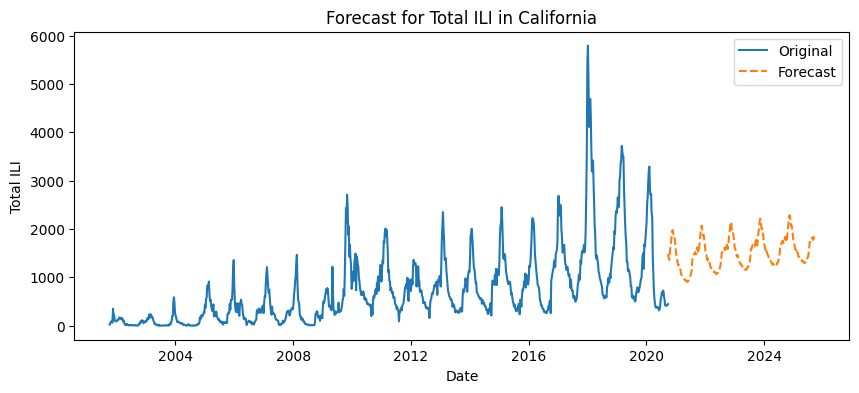

Forecast for Central:
2016-12-10    228.585102
2016-12-17    229.183637
2016-12-24    201.915214
2016-12-31    220.648616
2017-01-07    278.907464
                 ...    
2021-10-30    346.381721
2021-11-06    338.092424
2021-11-13    377.816625
2021-11-20    327.517976
2021-11-27    379.070141
Freq: W-SAT, Name: predicted_mean, Length: 260, dtype: float64
Error Metrics for Central:
MAE: 135.6019634980944
MSE: 26592.506649659706
RMSE: 163.07209034552696


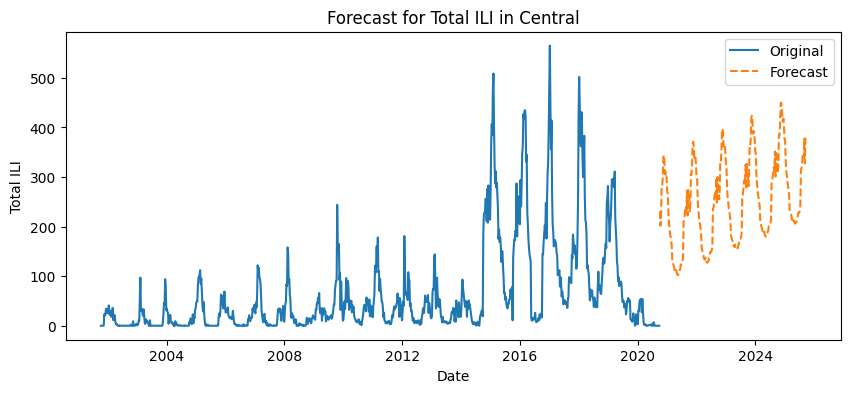

Forecast for Lower Southern:
2016-12-10    335.090861
2016-12-17    314.773933
2016-12-24    307.831574
2016-12-31    325.358931
2017-01-07    383.820225
                 ...    
2021-10-30    377.699052
2021-11-06    366.627410
2021-11-13    356.566008
2021-11-20    377.078964
2021-11-27    404.032784
Freq: W-SAT, Name: predicted_mean, Length: 260, dtype: float64
Error Metrics for Lower Southern:
MAE: 285.54933391703287
MSE: 256940.1486631013
RMSE: 506.8926401745258


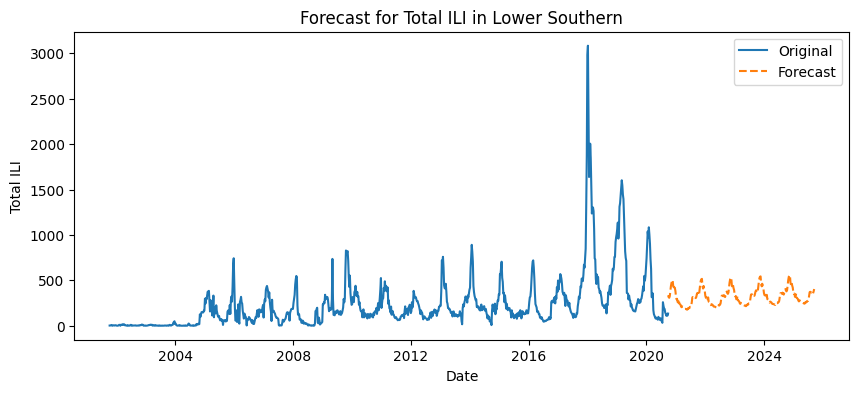

Forecast for Northern:
2016-12-10    218.001907
2016-12-17    210.828460
2016-12-24    213.100638
2016-12-31    224.550106
2017-01-07    238.799391
                 ...    
2021-10-30    284.173136
2021-11-06    280.135015
2021-11-13    279.099006
2021-11-20    283.807495
2021-11-27    283.272096
Freq: W-SAT, Name: predicted_mean, Length: 260, dtype: float64
Error Metrics for Northern:
MAE: 143.02999085413364
MSE: 42072.707162467035
RMSE: 205.11632592864723


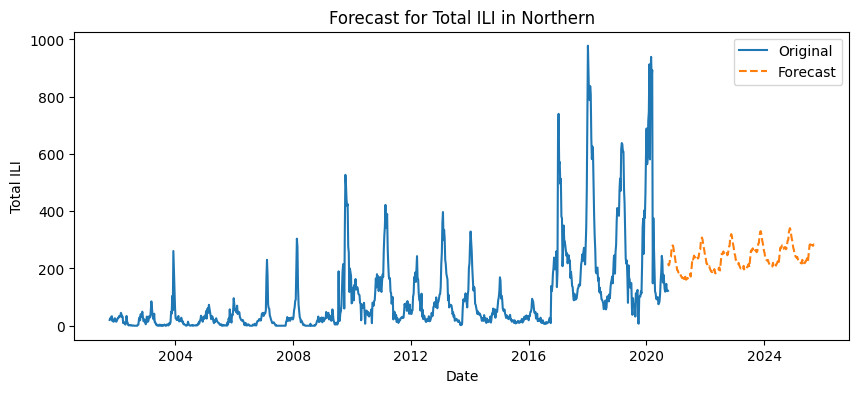

Forecast for Upper Southern:
2016-12-10    71.684643
2016-12-17    54.204699
2016-12-24    52.868356
2016-12-31    74.023601
2017-01-07    83.013314
                ...    
2021-10-30    86.916408
2021-11-06    80.343482
2021-11-13    64.140432
2021-11-20    73.930105
2021-11-27    79.496842
Freq: W-SAT, Name: predicted_mean, Length: 260, dtype: float64
Error Metrics for Upper Southern:
MAE: 26.88472129779194
MSE: 1001.8736113146507
RMSE: 31.652387134537747


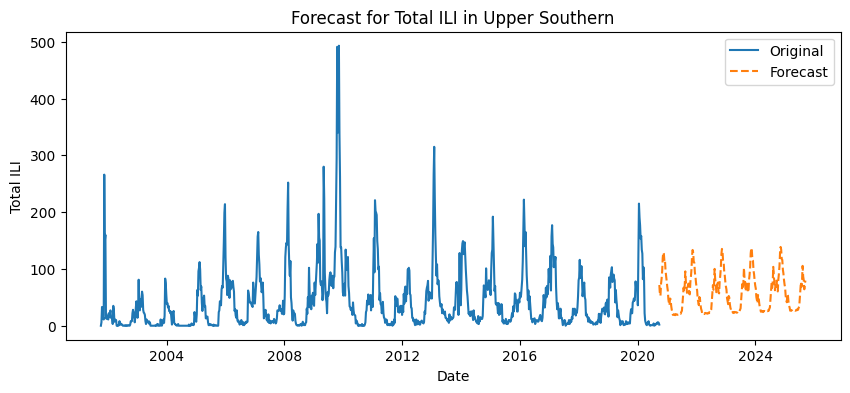

In [98]:
 # Display the forecasts and error metrics
for region, forecast in forecasts.items():
    print(f'Forecast for {region}:')
    print(forecast)

    print(f'Error Metrics for {region}:')
    print(f"MAE: {error_metrics[region]['MAE']}")
    print(f"MSE: {error_metrics[region]['MSE']}")
    print(f"RMSE: {error_metrics[region]['RMSE']}")

    plt.figure(figsize=(10, 4))
    plt.plot(region_data[region], label='Original')
    plt.plot(pd.date_range(start=region_data[region].index[-1], periods=260, freq='W'), forecast, label='Forecast', linestyle='--')
    plt.title(f'Forecast for Total ILI in {region}')
    plt.xlabel('Date')
    plt.ylabel('Total ILI')
    plt.legend()
    plt.show()

In [100]:
# Summarize all of these error value in a table view:
import pandas as pd

# Create a list to store the data for each region
results = []

# Loop through each region and gather the error metrics
for region in error_metrics:
    mae = error_metrics[region]['MAE']
    mse = error_metrics[region]['MSE']
    rmse = error_metrics[region]['RMSE']
    results.append([region, mae, mse, rmse])

# Create a DataFrame from the results list
results_df = pd.DataFrame(results, columns=['Region', 'MAE', 'MSE', 'RMSE'])

# Display the DataFrame
print("Results of the SARIMA Model: (0,1,2) (1,1,1,52)")
print(results_df)

Results of the SARIMA Model: (0,1,2) (1,1,1,52)
           Region         MAE            MSE        RMSE
0        Bay Area  162.537627   45715.275066  213.811307
1      California  610.556827  774585.047728  880.105134
2         Central  135.601963   26592.506650  163.072090
3  Lower Southern  285.549334  256940.148663  506.892640
4        Northern  143.029991   42072.707162  205.116326
5  Upper Southern   26.884721    1001.873611   31.652387


In [20]:
# Results of the SARIMA Model: (1,1,0) (1,1,1,52)
#            Region         MAE            MSE        RMSE
# 0        Bay Area  166.256380   46025.119489  214.534658
# 1      California  610.496138  774592.114511  880.109149
# 2         Central  134.975760   26414.431777  162.525173
# 3  Lower Southern  286.028678  257794.099198  507.734280
# 4        Northern  142.919814   42120.426999  205.232617
# 5  Upper Southern   26.766404     995.410579   31.550128

In [21]:
# Results of the SARIMA Model: (1,1,1) (1,1,1,52)
#            Region         MAE            MSE        RMSE
# 0        Bay Area  150.367789   40715.911967  201.781843
# 1      California  597.267509  743163.535432  862.069333
# 2         Central  134.974681   26414.526326  162.525464
# 3  Lower Southern  295.177445  269819.768918  519.441786
# 4        Northern  186.226114   72505.848349  269.269100
# 5  Upper Southern   25.942423     953.018739   30.871002

# Further Tuning:

For regions with high errors (e.g., California, Lower Southern), consider tuning the ARIMA parameters further or trying different models like SARIMA to capture seasonality.
Use cross-validation to find the best parameters.

# SARIMA model for Forecasting on California dataset

# Evaluate the SARIMA model for the California dataset, you can follow these steps:

- Model Diagnostics:

 - Plot the residuals to check for patterns.
 - Plot the ACF and PACF of the residuals to check for remaining autocorrelation.
 - Perform statistical tests on the residuals (e.g., Ljung-Box test).

- Error Metrics:

 - Split the data into training and test sets.
 - Fit the SARIMA model on the training set and forecast on the test set.
 - Calculate error metrics (MAE, MSE, RMSE) on the test set.

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



No supported index is available. Prediction results will be given with an integer index beginning at `start`.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/pyth

MAE: 610.5568271043755
MSE: 774585.0477279008
RMSE: 880.1051344742291


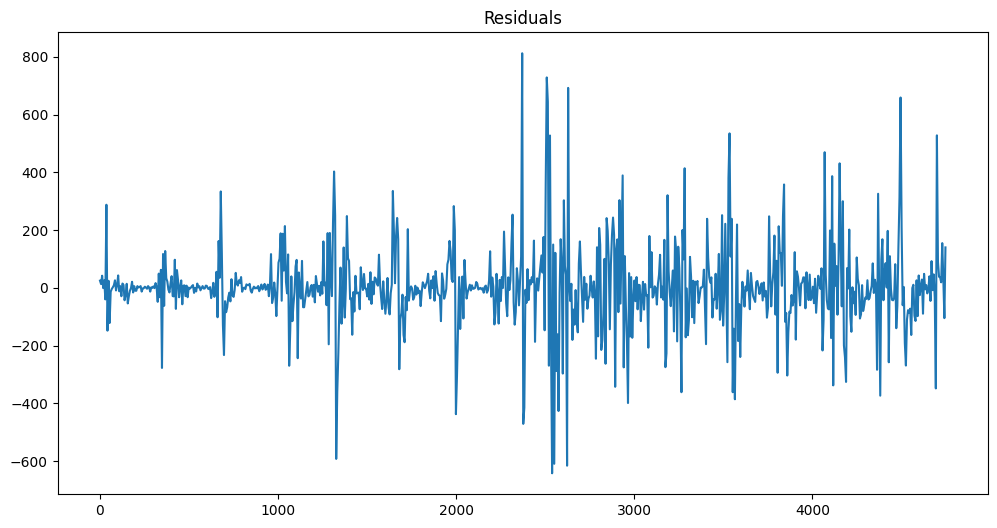

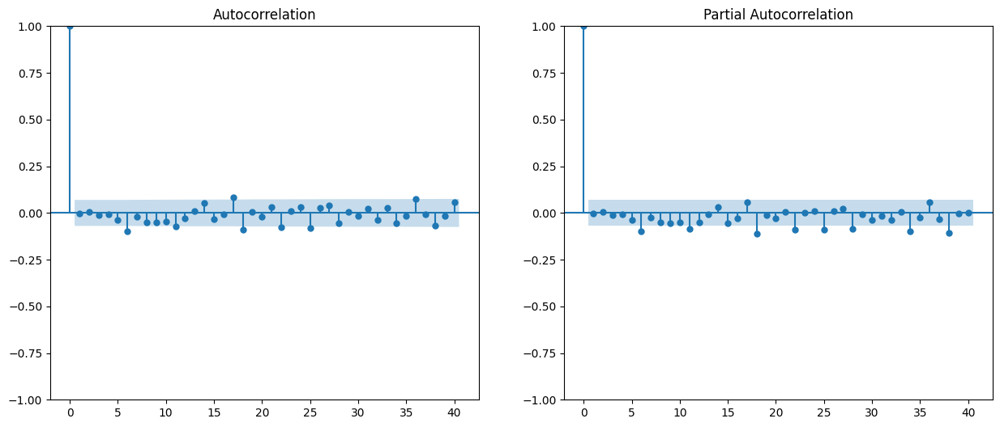

Ljung-Box test results:
      lb_stat  lb_pvalue
10  14.862989   0.137137


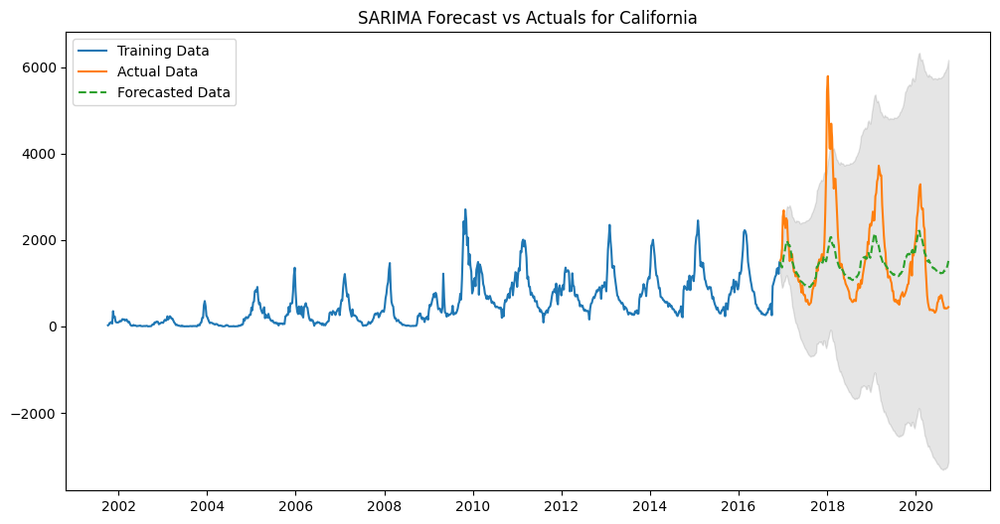

In [102]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.stats.diagnostic import acorr_ljungbox
import statsmodels.api as sm  # Import statsmodels as sm

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')

# Filter data for California region
df_california = df[df['region'] == 'California'][['weekending', 'Total_ILI']].rename(columns={'weekending': 'ds', 'Total_ILI': 'y'})

# Split data into training and test sets
train_size = int(len(df_california) * 0.8)
train_df = df_california[:train_size]
test_df = df_california[train_size:]

# Fit SARIMA model on training data
sarima_model = SARIMAX(train_df['y'], order=(0, 1, 2), seasonal_order=(1, 1, 1, 52))
sarima_result = sarima_model.fit(disp=False)

# Forecast on the test set
forecast = sarima_result.get_forecast(steps=len(test_df))
forecast_df = forecast.conf_int()
forecast_df['yhat'] = forecast.predicted_mean
forecast_df['y'] = test_df['y'].values

# Calculate error metrics
mae = mean_absolute_error(test_df['y'], forecast_df['yhat'])
mse = mean_squared_error(test_df['y'], forecast_df['yhat'])
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

# Plot residuals
residuals = sarima_result.resid
plt.figure(figsize=(12, 6))
plt.plot(residuals)
plt.title('Residuals')
plt.show()

# Plot ACF and PACF of residuals
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
fig = sm.graphics.tsa.plot_acf(residuals, lags=40, ax=ax[0])
fig = sm.graphics.tsa.plot_pacf(residuals, lags=40, ax=ax[1])
plt.show()

# Perform Ljung-Box test
ljung_box_result = acorr_ljungbox(residuals, lags=[10], return_df=True)
print("Ljung-Box test results:")
print(ljung_box_result)

# Plotting forecast vs actuals
plt.figure(figsize=(12, 6))
plt.plot(train_df['ds'], train_df['y'], label='Training Data')
plt.plot(test_df['ds'], test_df['y'], label='Actual Data')
plt.plot(test_df['ds'], forecast_df['yhat'], label='Forecasted Data', linestyle='--')
plt.fill_between(test_df['ds'], forecast_df['lower y'], forecast_df['upper y'], color='k', alpha=0.1)
plt.title('SARIMA Forecast vs Actuals for California')
plt.legend()
plt.show()

# SARIMA model for Bay Area

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



No frequency information was provided, so inferred frequency W-SAT will be used.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



No frequency information was provided, so inferred frequency W-SAT will be used.




                                      SARIMAX Results                                       
Dep. Variable:                            Total_ILI   No. Observations:                  991
Model:             SARIMAX(0, 1, 2)x(1, 1, [1], 52)   Log Likelihood               -5442.366
Date:                              Sat, 18 May 2024   AIC                          10894.733
Time:                                      00:33:28   BIC                          10918.952
Sample:                                  10-06-2001   HQIC                         10903.966
                                       - 09-26-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3102      0.016    -19.136      0.000      -0.342      -0.278
ma.L2         -0.03

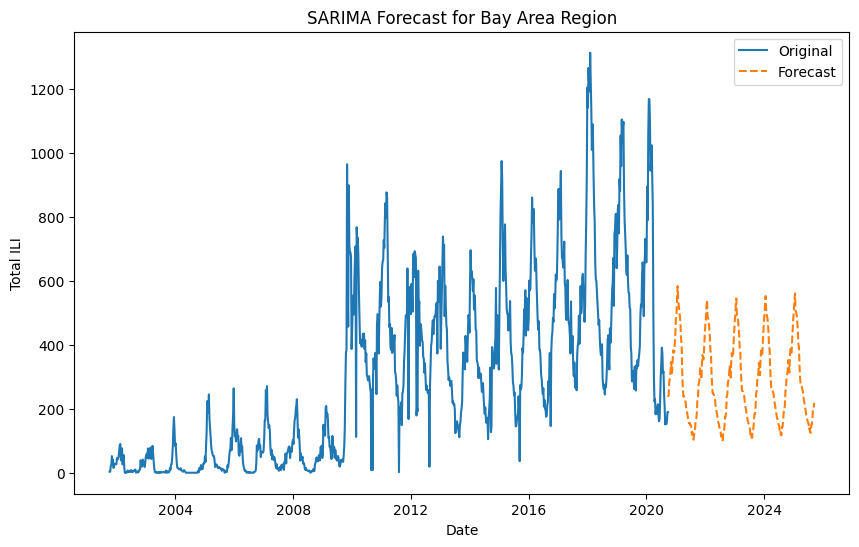

In [105]:
# Bay Area region
region_data_bay_area = df[df['region'] == 'Bay Area']['Total_ILI']

# SARIMA model
model_sarima = SARIMAX(region_data_bay_area, order=(0, 1, 2), seasonal_order=(1, 1, 1, 52))
model_fit_sarima = model_sarima.fit()
print(model_fit_sarima.summary())

# Forecast
steps = 260
forecast_sarima = model_fit_sarima.get_forecast(steps=steps)
forecast_index = pd.date_range(start=region_data_bay_area.index[-1], periods=steps, freq='W')
forecast_sarima = forecast_sarima.predicted_mean
forecast_sarima.index = forecast_index

# Plot the forecast
plt.figure(figsize=(10, 6))
plt.plot(region_data_bay_area, label='Original')
plt.plot(forecast_sarima, label='Forecast', linestyle='--')
plt.title('SARIMA Forecast for Bay Area Region')
plt.xlabel('Date')
plt.ylabel('Total ILI')
plt.legend()
plt.show()

# Evaluate // SARIMA model - Evaluate Bay Area region

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



No supported index is available. Prediction results will be given with an integer index beginning at `start`.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/pyth

MAE: 162.53762700589525
MSE: 45715.27506580574
RMSE: 213.81130715143607


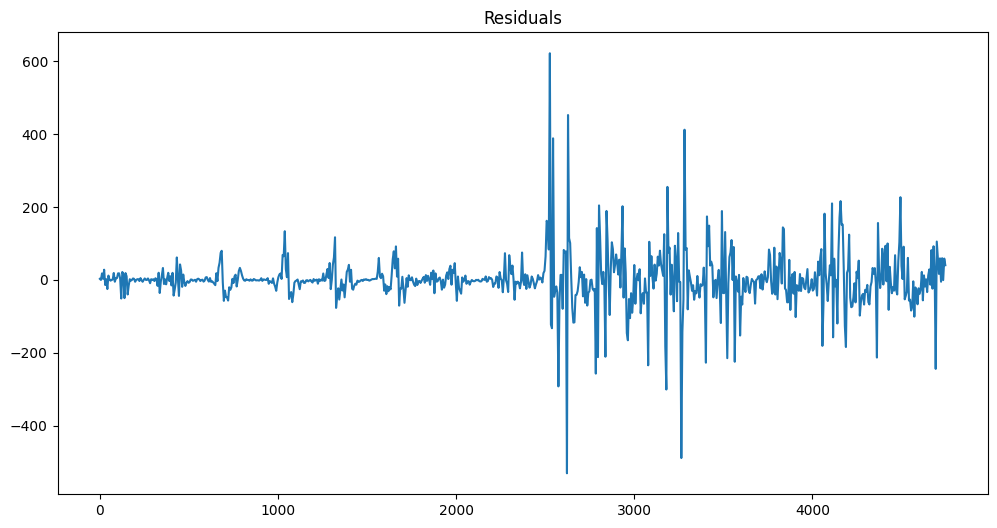

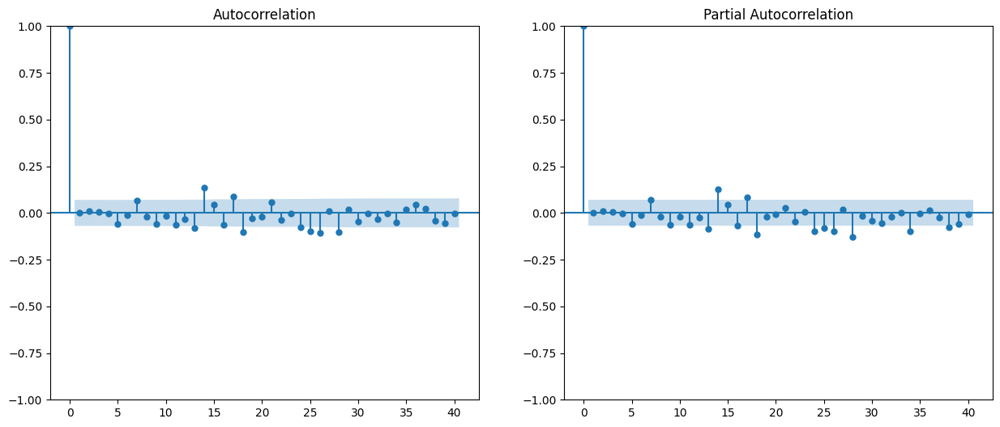

Ljung-Box test results:
      lb_stat  lb_pvalue
10  10.382767   0.407578


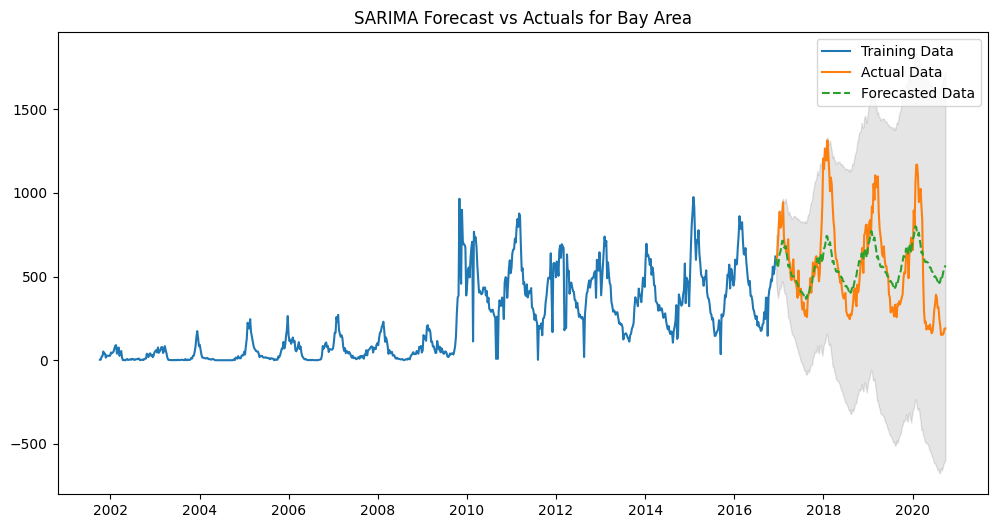

In [106]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.stats.diagnostic import acorr_ljungbox
import statsmodels.api as sm  # Import statsmodels as sm

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')

# Filter data for Bay Area region
df_bay_area = df[df['region'] == 'Bay Area'][['weekending', 'Total_ILI']].rename(columns={'weekending': 'ds', 'Total_ILI': 'y'})

# Split data into training and test sets
train_size = int(len(df_bay_area) * 0.8)
train_df = df_bay_area[:train_size]
test_df = df_bay_area[train_size:]

# Fit SARIMA model on training data
sarima_model = SARIMAX(train_df['y'], order=(0, 1, 2), seasonal_order=(1, 1, 1, 52))
sarima_result = sarima_model.fit(disp=False)

# Forecast on the test set
forecast = sarima_result.get_forecast(steps=len(test_df))
forecast_df = forecast.conf_int()
forecast_df['yhat'] = forecast.predicted_mean
forecast_df['y'] = test_df['y'].values

# Calculate error metrics
mae = mean_absolute_error(test_df['y'], forecast_df['yhat'])
mse = mean_squared_error(test_df['y'], forecast_df['yhat'])
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

# Plot residuals
residuals = sarima_result.resid
plt.figure(figsize=(12, 6))
plt.plot(residuals)
plt.title('Residuals')
plt.show()

# Plot ACF and PACF of residuals
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
fig = sm.graphics.tsa.plot_acf(residuals, lags=40, ax=ax[0])
fig = sm.graphics.tsa.plot_pacf(residuals, lags=40, ax=ax[1])
plt.show()

# Perform Ljung-Box test
ljung_box_result = acorr_ljungbox(residuals, lags=[10], return_df=True)
print("Ljung-Box test results:")
print(ljung_box_result)

# Plotting forecast vs actuals
plt.figure(figsize=(12, 6))
plt.plot(train_df['ds'], train_df['y'], label='Training Data')
plt.plot(test_df['ds'], test_df['y'], label='Actual Data')
plt.plot(test_df['ds'], forecast_df['yhat'], label='Forecasted Data', linestyle='--')
plt.fill_between(test_df['ds'], forecast_df['lower y'], forecast_df['upper y'], color='k', alpha=0.1)
plt.title('SARIMA Forecast vs Actuals for Bay Area')
plt.legend()
plt.show()

# Evaluate // SARIMA model for Central region

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



No supported index is available. Prediction results will be given with an integer index beginning at `start`.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/pyth

MAE: 134.83093142584295
MSE: 26367.57277370486
RMSE: 162.38094954059378


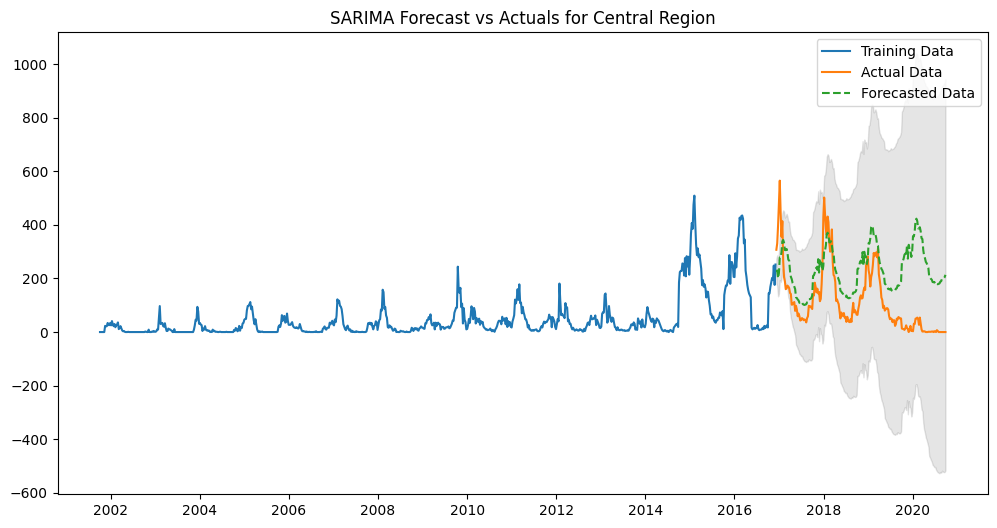

In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import statsmodels.api as sm

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')

# Filter data for Central region
df_central = df[df['region'] == 'Central'][['weekending', 'Total_ILI']].rename(columns={'weekending': 'ds', 'Total_ILI': 'y'})

# Split data into training and test sets
train_size = int(len(df_central) * 0.8)
train_df = df_central[:train_size]
test_df = df_central[train_size:]

# Fit SARIMA model on training data
sarima_model = SARIMAX(train_df['y'], order=(1, 1, 2), seasonal_order=(1, 1, 1, 52))
sarima_result = sarima_model.fit(disp=False)

# Forecast on the test set
forecast = sarima_result.get_forecast(steps=len(test_df))
forecast_df = forecast.conf_int()
forecast_df['yhat'] = forecast.predicted_mean
forecast_df['y'] = test_df['y'].values

# Calculate error metrics
mae = mean_absolute_error(test_df['y'], forecast_df['yhat'])
mse = mean_squared_error(test_df['y'], forecast_df['yhat'])
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

# Plotting forecast vs actuals
plt.figure(figsize=(12, 6))
plt.plot(train_df['ds'], train_df['y'], label='Training Data')
plt.plot(test_df['ds'], test_df['y'], label='Actual Data')
plt.plot(test_df['ds'], forecast_df['yhat'], label='Forecasted Data', linestyle='--')
plt.fill_between(test_df['ds'], forecast_df['lower y'], forecast_df['upper y'], color='k', alpha=0.1)
plt.title('SARIMA Forecast vs Actuals for Central Region')
plt.legend()
plt.show()


In [113]:
# SARIMA model
model_sarima = SARIMAX(region_data_central, order=(1, 1, 2), seasonal_order=(1, 1, 1, 52))
model_fit_sarima = model_sarima.fit()
print(model_fit_sarima.summary())

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.




                                      SARIMAX Results                                       
Dep. Variable:                            Total_ILI   No. Observations:                  991
Model:             SARIMAX(1, 1, 2)x(1, 1, [1], 52)   Log Likelihood               -4436.976
Date:                              Sat, 18 May 2024   AIC                           8885.951
Time:                                      01:00:46   BIC                           8915.014
Sample:                                           0   HQIC                          8897.032
                                              - 991                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2735      0.479      0.571      0.568      -0.665       1.212
ma.L1         -0.38

# Evaluate // SARIMA model for Northern region

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



No supported index is available. Prediction results will be given with an integer index beginning at `start`.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/pyth

MAE: 184.53062276615927
MSE: 71799.54717597413
RMSE: 267.95437517602534


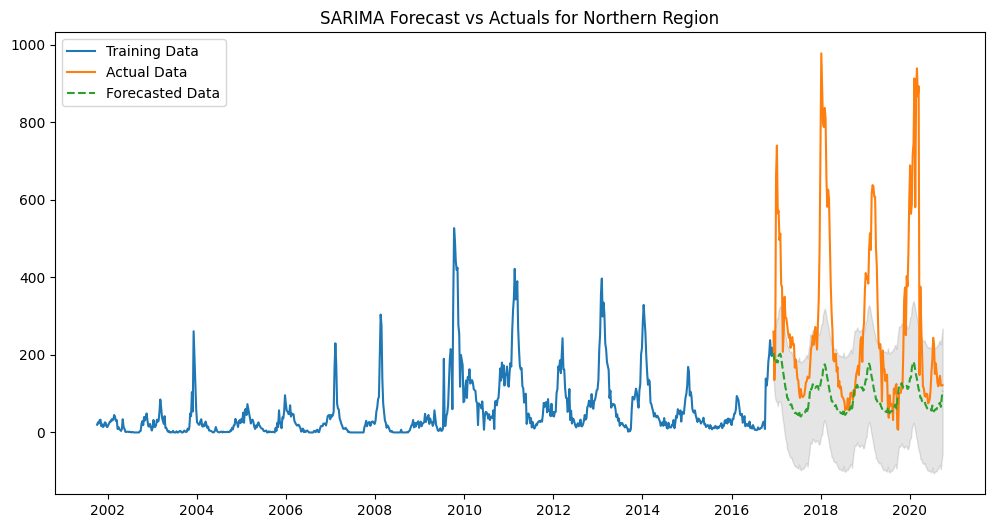

In [114]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import statsmodels.api as sm

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')

# Filter data for Central region
df_northern = df[df['region'] == 'Northern'][['weekending', 'Total_ILI']].rename(columns={'weekending': 'ds', 'Total_ILI': 'y'})

# Split data into training and test sets
train_size = int(len(df_northern) * 0.8)
train_df = df_northern[:train_size]
test_df = df_northern[train_size:]

# Fit SARIMA model on training data
sarima_model = SARIMAX(train_df['y'], order=(1, 1, 2), seasonal_order=(1, 1, 1, 52))
sarima_result = sarima_model.fit(disp=False)

# Forecast on the test set
forecast = sarima_result.get_forecast(steps=len(test_df))
forecast_df = forecast.conf_int()
forecast_df['yhat'] = forecast.predicted_mean
forecast_df['y'] = test_df['y'].values

# Calculate error metrics
mae = mean_absolute_error(test_df['y'], forecast_df['yhat'])
mse = mean_squared_error(test_df['y'], forecast_df['yhat'])
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

# Plotting forecast vs actuals
plt.figure(figsize=(12, 6))
plt.plot(train_df['ds'], train_df['y'], label='Training Data')
plt.plot(test_df['ds'], test_df['y'], label='Actual Data')
plt.plot(test_df['ds'], forecast_df['yhat'], label='Forecasted Data', linestyle='--')
plt.fill_between(test_df['ds'], forecast_df['lower y'], forecast_df['upper y'], color='k', alpha=0.1)
plt.title('SARIMA Forecast vs Actuals for Northern Region')
plt.legend()
plt.show()


# Evaluate // SARIMA model for Upper Southern region

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Maximum Likelihood optimization failed to converge. Check mle_retvals


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supp

MAE: 26.333932295585903
MSE: 974.650503834226
RMSE: 31.219393072803737


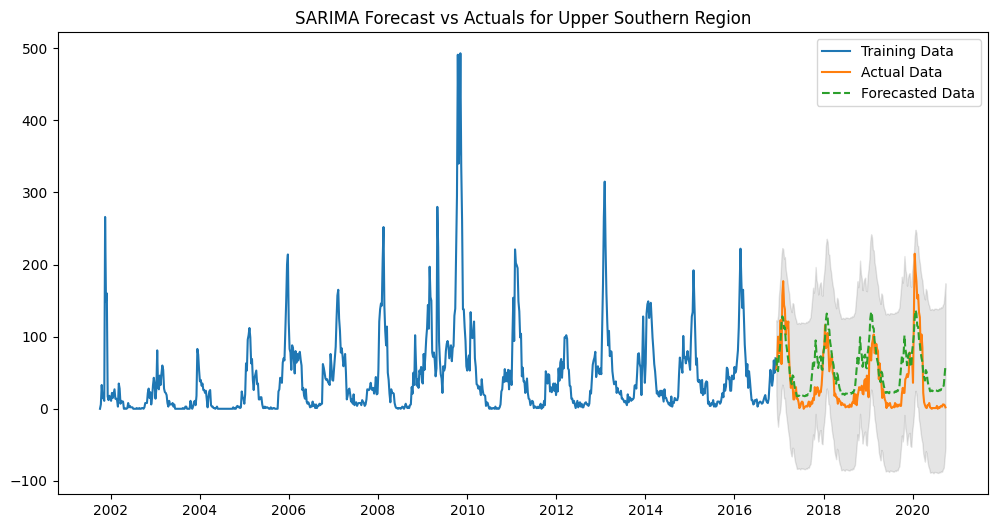

In [118]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import statsmodels.api as sm

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')

# Filter data for Upper Southern region
df_upper_southern = df[df['region'] == 'Upper Southern'][['weekending', 'Total_ILI']].rename(columns={'weekending': 'ds', 'Total_ILI': 'y'})

# Split data into training and test sets
train_size = int(len(df_upper_southern) * 0.8)
train_df = df_upper_southern[:train_size]
test_df = df_upper_southern[train_size:]

# Fit SARIMA model on training data
sarima_model = SARIMAX(train_df['y'], order=(2, 1, 2), seasonal_order=(1, 1, 1, 52))
sarima_result = sarima_model.fit(disp=False)

# Forecast on the test set
forecast = sarima_result.get_forecast(steps=len(test_df))
forecast_df = forecast.conf_int()
forecast_df['yhat'] = forecast.predicted_mean
forecast_df['y'] = test_df['y'].values

# Calculate error metrics
mae = mean_absolute_error(test_df['y'], forecast_df['yhat'])
mse = mean_squared_error(test_df['y'], forecast_df['yhat'])
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

# Plotting forecast vs actuals
plt.figure(figsize=(12, 6))
plt.plot(train_df['ds'], train_df['y'], label='Training Data')
plt.plot(test_df['ds'], test_df['y'], label='Actual Data')
plt.plot(test_df['ds'], forecast_df['yhat'], label='Forecasted Data', linestyle='--')
plt.fill_between(test_df['ds'], forecast_df['lower y'], forecast_df['upper y'], color='k', alpha=0.1)
plt.title('SARIMA Forecast vs Actuals for Upper Southern Region')
plt.legend()
plt.show()


# Evaluate // SARIMA model for Lower Southern region

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



An unsupported index was provided and will be ignored when e.g. forecasting.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.



Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodel

MAE: 286.8564200477103
MSE: 258740.74959206925
RMSE: 508.6656559981903


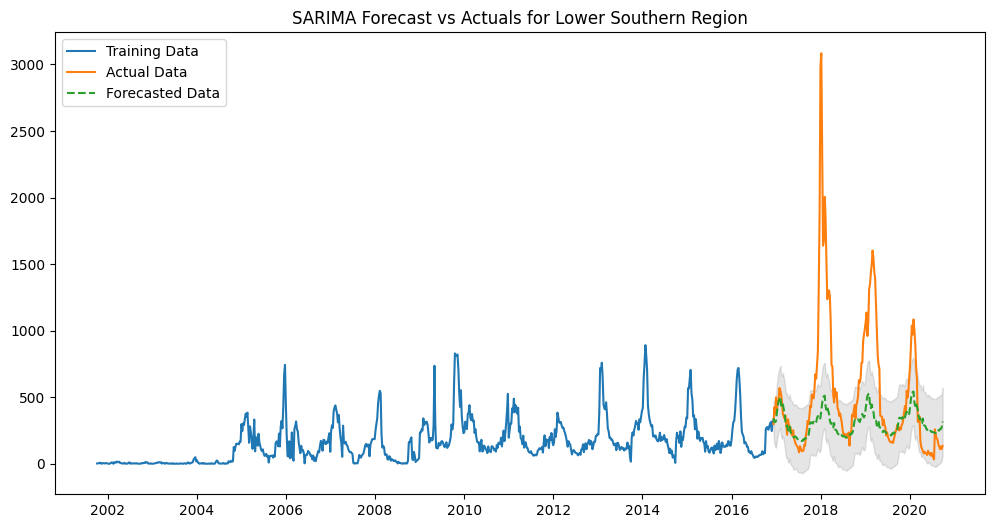

In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import statsmodels.api as sm

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')

# Filter data for Upper Southern region
df_lower_southern = df[df['region'] == 'Lower Southern'][['weekending', 'Total_ILI']].rename(columns={'weekending': 'ds', 'Total_ILI': 'y'})

# Split data into training and test sets
train_size = int(len(df_lower_southern) * 0.8)
train_df = df_lower_southern[:train_size]
test_df = df_lower_southern[train_size:]

# Fit SARIMA model on training data
sarima_model = SARIMAX(train_df['y'], order=(2, 1, 2), seasonal_order=(1, 1, 1, 52))
sarima_result = sarima_model.fit(disp=False)

# Forecast on the test set
forecast = sarima_result.get_forecast(steps=len(test_df))
forecast_df = forecast.conf_int()
forecast_df['yhat'] = forecast.predicted_mean
forecast_df['y'] = test_df['y'].values

# Calculate error metrics
mae = mean_absolute_error(test_df['y'], forecast_df['yhat'])
mse = mean_squared_error(test_df['y'], forecast_df['yhat'])
rmse = np.sqrt(mse)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

# Plotting forecast vs actuals
plt.figure(figsize=(12, 6))
plt.plot(train_df['ds'], train_df['y'], label='Training Data')
plt.plot(test_df['ds'], test_df['y'], label='Actual Data')
plt.plot(test_df['ds'], forecast_df['yhat'], label='Forecasted Data', linestyle='--')
plt.fill_between(test_df['ds'], forecast_df['lower y'], forecast_df['upper y'], color='k', alpha=0.1)
plt.title('SARIMA Forecast vs Actuals for Lower Southern Region')
plt.legend()
plt.show()

# Check for Stationarity
- Plot the Time Series:

  - Visual inspection can give a quick idea about trends and seasonality, which indicate non-stationarity.

- Rolling Statistics:

  - Plot the rolling mean and variance to see if they remain constant over time.

- Augmented Dickey-Fuller (ADF) Test:

  - A statistical test to formally check for stationarity.

WARNING - (py.warnings._showwarnmsg) - <ipython-input-120-d53a28ac404c>:7: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.




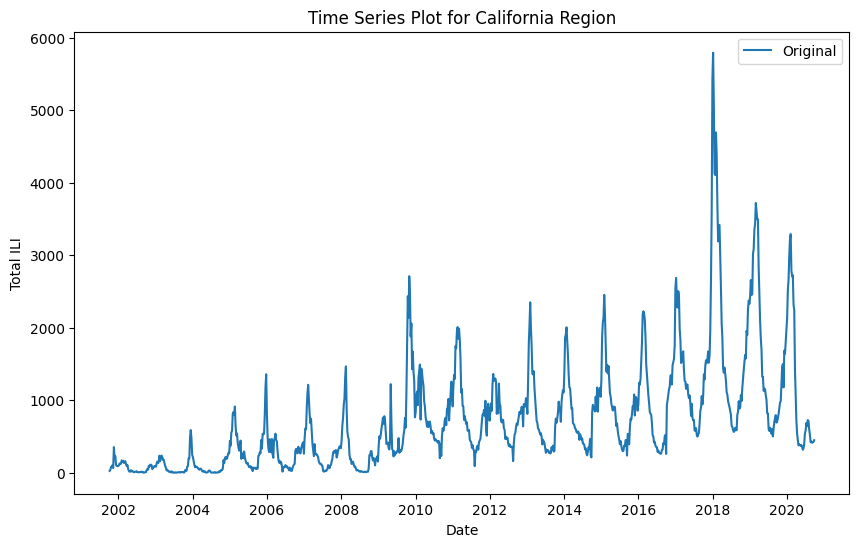

In [120]:
# Load and Plot the Time Series
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')
df['weekending'] = pd.to_datetime(df['weekending'])
df.set_index('weekending', inplace=True)

# Example data for the California region
region_data_california = df[df['region'] == 'California']['Total_ILI']

# Plot the time series
plt.figure(figsize=(10, 6))
plt.plot(region_data_california, label='Original')
plt.title('Time Series Plot for California Region')
plt.xlabel('Date')
plt.ylabel('Total ILI')
plt.legend()
plt.show()


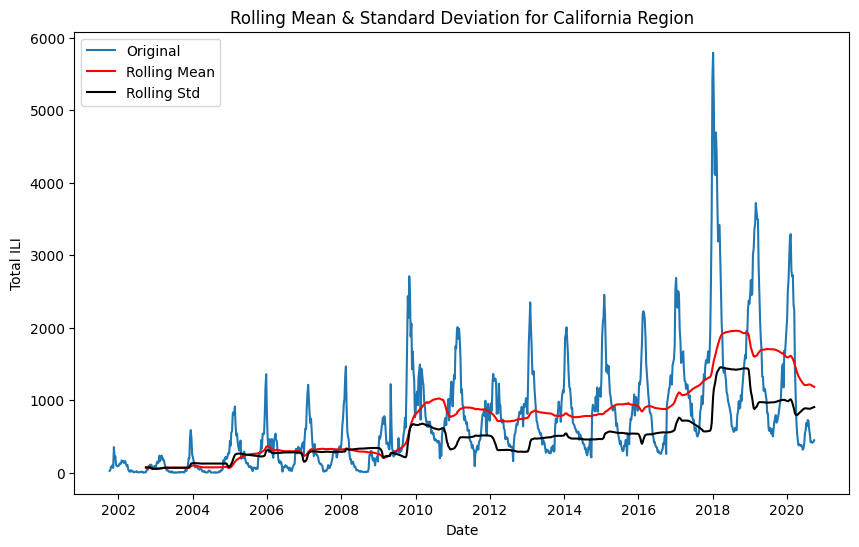

In [121]:
# Plot Rolling Statistics
# Calculate rolling statistics
rolling_mean = region_data_california.rolling(window=52).mean()
rolling_std = region_data_california.rolling(window=52).std()

# Plot rolling statistics
plt.figure(figsize=(10, 6))
plt.plot(region_data_california, label='Original')
plt.plot(rolling_mean, color='red', label='Rolling Mean')
plt.plot(rolling_std, color='black', label='Rolling Std')
plt.title('Rolling Mean & Standard Deviation for California Region')
plt.xlabel('Date')
plt.ylabel('Total ILI')
plt.legend()
plt.show()

In [122]:
# Perform Augmented Dickey-Fuller (ADF) Test
from statsmodels.tsa.stattools import adfuller

# Perform ADF test
adf_result = adfuller(region_data_california)

# Print ADF test results
print('ADF Statistic: %f' % adf_result[0])
print('p-value: %f' % adf_result[1])
print('Critical Values:')
for key, value in adf_result[4].items():
    print('\t%s: %.3f' % (key, value))

# Interpretation
if adf_result[1] <= 0.05:
    print("The time series is stationary")
else:
    print("The time series is non-stationary")

ADF Statistic: -5.416266
p-value: 0.000003
Critical Values:
	1%: -3.437
	5%: -2.864
	10%: -2.568
The time series is stationary


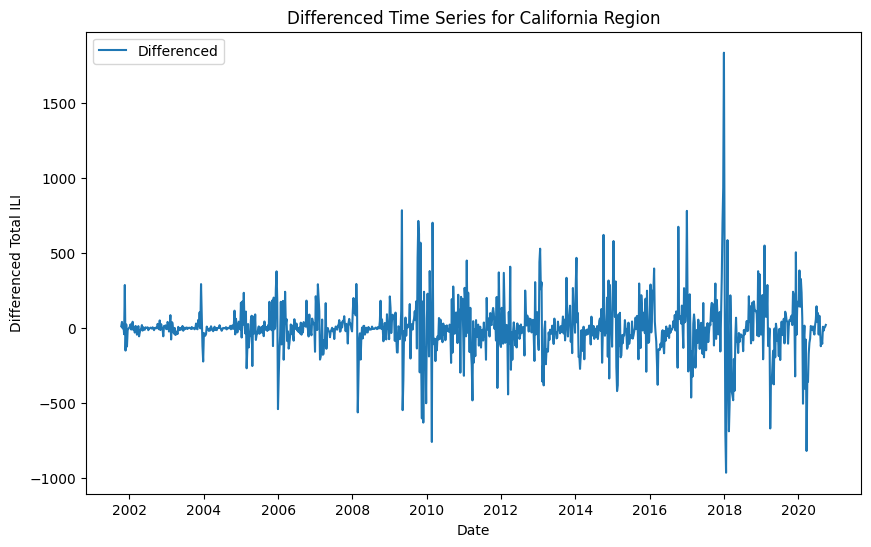

ADF Statistic: -8.719139
p-value: 0.000000
Critical Values:
	1%: -3.437
	5%: -2.865
	10%: -2.568
The differenced time series is stationary


In [123]:
# Differencing
region_data_diff = region_data_california.diff().dropna()

# Plot differenced data
plt.figure(figsize=(10, 6))
plt.plot(region_data_diff, label='Differenced')
plt.title('Differenced Time Series for California Region')
plt.xlabel('Date')
plt.ylabel('Differenced Total ILI')
plt.legend()
plt.show()

# Perform ADF test on differenced data
adf_result_diff = adfuller(region_data_diff)
print('ADF Statistic: %f' % adf_result_diff[0])
print('p-value: %f' % adf_result_diff[1])
print('Critical Values:')
for key, value in adf_result_diff[4].items():
    print('\t%s: %.3f' % (key, value))

# Interpretation
if adf_result_diff[1] <= 0.05:
    print("The differenced time series is stationary")
else:
    print("The differenced time series is non-stationary")


Since the p-value is significantly less than 0.05 and the ADF Statistic is less than all the critical values, we reject the null hypothesis that the time series is non-stationary. Therefore, the differenced time series is stationary.

# Next Steps: Fit ARIMA/SARIMA Model on Differenced Series
Now that the time series is stationary, you can fit an ARIMA or SARIMA model to this differenced series. Here’s how you can do it:

- Fit SARIMA Model: Use the differenced data to fit a SARIMA model.
- Evaluate Model: Calculate error metrics (MAE, MSE, RMSE) for the model.

**Fit SARIMA Model**

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



No frequency information was provided, so inferred frequency W-SAT will be used.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



No frequency information was provided, so inferred frequency W-SAT will be used.




                                      SARIMAX Results                                       
Dep. Variable:                            Total_ILI   No. Observations:                  991
Model:             SARIMAX(1, 1, 2)x(1, 1, [1], 52)   Log Likelihood               -6176.989
Date:                              Sat, 18 May 2024   AIC                          12365.977
Time:                                      01:29:54   BIC                          12395.040
Sample:                                  10-06-2001   HQIC                         12377.057
                                       - 09-26-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9088      0.011     85.978      0.000       0.888       0.930
ma.L1         -0.86

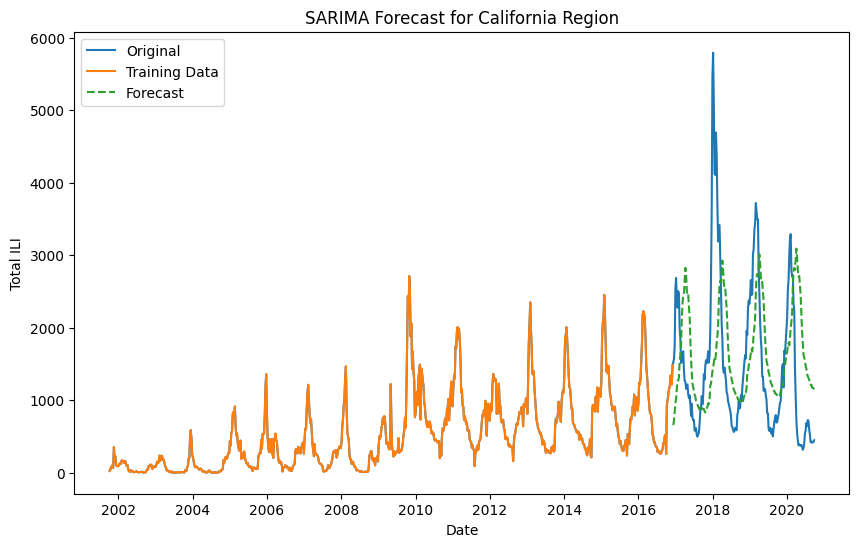

In [124]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Fit SARIMA model on the differenced data
model_sarima = SARIMAX(region_data_california, order=(1, 1, 2), seasonal_order=(1, 1, 1, 52))
model_fit_sarima = model_sarima.fit()
print(model_fit_sarima.summary())

# Make forecasts on the test set
forecast_steps = len(test_data)
forecast_sarima = model_fit_sarima.get_forecast(steps=forecast_steps)
forecast_index = test_data.index
forecast_sarima = forecast_sarima.predicted_mean
forecast_sarima.index = forecast_index

# Calculate error metrics
mae = mean_absolute_error(test_data, forecast_sarima)
mse = mean_squared_error(test_data, forecast_sarima)
rmse = np.sqrt(mse)

# Print error metrics
print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

# Plot the original data, training data, and forecast
plt.figure(figsize=(10, 6))
plt.plot(region_data_california, label='Original')
plt.plot(train_data, label='Training Data')
plt.plot(forecast_sarima, label='Forecast', linestyle='--')
plt.title('SARIMA Forecast for California Region')
plt.xlabel('Date')
plt.ylabel('Total ILI')
plt.legend()
plt.show()

# *We can apply the same code to run for other regions*

# Model Diagnostics
Examine the residuals of the model to ensure they resemble white noise.

The model diagnostics plots provide valuable insights into the performance and appropriateness of the SARIMA model. Let's interpret each of the plots:

# 1. Standardized Residual Plot
- Plot Description: This plot shows the residuals (differences between the actual and predicted values) over time.
- Interpretation:
  - Residuals should be randomly scattered around zero without any obvious patterns.
  - In the plot, the residuals seem to fluctuate around zero, which is a good sign. However, there are periods, especially around 2008-2010, where the residuals show large deviations. This indicates that the model may not be capturing some underlying patterns or anomalies during these periods.

# 2. Histogram Plus Estimated Density
- Plot Description: This plot shows the distribution of residuals along with a kernel density estimate (KDE) and a normal distribution curve (N(0,1)).
- Interpretation:
  - Ideally, the residuals should follow a normal distribution centered around zero.
  - In the plot, the histogram indicates that the residuals are roughly normally distributed but with some deviations. The KDE (orange line) follows a similar trend to the normal distribution (green line), but there are discrepancies, suggesting the residuals may not be perfectly normal.

# 3. Normal Q-Q Plot
- Plot Description: This plot compares the quantiles of the residuals to the quantiles of a standard normal distribution.
- Interpretation:
  - If the residuals are normally distributed, the points should lie along the red line.
  - In the plot, the points generally follow the red line but deviate at the tails, indicating the presence of some outliers or non-normality in the residuals.

# 4. Correlogram (ACF of Residuals)
- Plot Description: This plot shows the autocorrelation function (ACF) of the residuals.
- Interpretation:
  -For a well-fitted model, the residuals should show no significant autocorrelation. Most of the autocorrelations should lie within the blue confidence intervals.
  - In the plot, the autocorrelations are mostly within the confidence intervals, suggesting that there is no significant autocorrelation in the residuals. This indicates that the SARIMA model has successfully captured the temporal dependencies in the data.

# Recommendations
- Address Anomalies and Outliers: The presence of large deviations in residuals during certain periods (e.g., around 2008-2010) suggests that there may be anomalies or outliers that the model is not capturing. Investigate these periods to understand the underlying causes and consider incorporating additional explanatory variables or using more robust modeling techniques.
- Further Model Tuning: Continue refining the SARIMA model parameters to improve the fit. Consider using automated tools like pmdarima for parameter selection.
- Non-Normal Residuals: Although the residuals are roughly normally distributed, there are some deviations. Consider using transformations (e.g., log transformation) to stabilize variance or applying a different error distribution if the normality assumption is critical.
- Additional Diagnostics: Perform additional diagnostic tests, such as the Ljung-Box test, to statistically assess the autocorrelation of residuals.

# Conclusion
The SARIMA model shows a reasonable fit with residuals centered around zero and no significant autocorrelation. However, there are some deviations from normality and large residuals during certain periods, indicating room for improvement. Further investigation and model tuning can help address these issues and improve the forecast accuracy.

# The code below is to view the error values in table view for ARIMA method

In [126]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'])

# Set the index to weekending
df.set_index('weekending', inplace=True)

# Filter data for each region
regions = df['region'].unique()
region_data = {region: df[df['region'] == region]['Total_ILI'] for region in regions}

# Function to fit ARIMA model and forecast
def fit_arima_forecast(data, order=(1,1,2), steps=260):
    train_size = int(len(data) * 0.8)
    train, test = data[:train_size], data[train_size:]

    # Fit the model
    model = ARIMA(train, order=order)
    model_fit = model.fit()

    # Forecast
    forecast = model_fit.forecast(steps=len(test))

    # Calculate error metrics
    mae = mean_absolute_error(test, forecast)
    mse = mean_squared_error(test, forecast)
    rmse = np.sqrt(mse)

    # Full forecast
    full_forecast = model_fit.forecast(steps=steps)

    return full_forecast, mae, mse, rmse

# Apply ARIMA to each region
arima_order = (1, 1, 1)  # Example order, you might want to tune this

forecasts = {}
error_metrics = {}
for region, data in region_data.items():
    full_forecast, mae, mse, rmse = fit_arima_forecast(data, order=arima_order)
    forecasts[region] = full_forecast
    error_metrics[region] = {'MAE': mae, 'MSE': mse, 'RMSE': rmse}

# Create a list to store the data for each region
results = []

# Loop through each region and gather the error metrics
for region in error_metrics:
    mae = error_metrics[region]['MAE']
    mse = error_metrics[region]['MSE']
    rmse = error_metrics[region]['RMSE']
    results.append([region, mae, mse, rmse])

# Create a DataFrame from the results list
results_df = pd.DataFrame(results, columns=['Region', 'MAE', 'MSE', 'RMSE'])

# Display the DataFrame
print("ARIMA Error Metrics (1,1,2)")
print(results_df)

# Optionally, you can save the DataFrame to a CSV file
#results_df.to_csv('forecast_error_metrics.csv', index=False)

WARNING - (py.warnings._showwarnmsg) - <ipython-input-126-cb132a1a5e8d>:11: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



No frequency information was provided, so inferred frequency W-SAT will be used.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.



No frequency information was provided, so infe

ARIMA Error Metrics (1,1,2)
           Region         MAE           MSE         RMSE
0        Bay Area  233.437133  7.955775e+04   282.059839
1      California  835.261021  1.160572e+06  1077.298485
2         Central  156.439069  2.916864e+04   170.788279
3  Lower Southern  331.968000  2.993404e+05   547.120129
4        Northern  162.534152  5.410056e+04   232.595268
5  Upper Southern   37.725074  1.989715e+03    44.606221


# Calculate and retrieve Error Metrics for NeuralProphet Methodology

In [127]:
# Load and Preprocess the Data
# Load the dataset and preprocess it to fit the format required by NeuralProphet.
import pandas as pd
import numpy as np
from neuralprophet import NeuralProphet
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format with specified format
df['weekending'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')

# Prepare data for NeuralProphet
df.rename(columns={'weekending': 'ds', 'Total_ILI': 'y'}, inplace=True)

# Initialize NeuralProphet model
model = NeuralProphet()

# Create a dictionary to store forecasts and error metrics
forecasts = {}
error_metrics = {}

In [128]:
# Loop through each region and fit the model
regions = df['region'].unique()
for region in regions:
    region_df = df[df['region'] == region][['ds', 'y']]

    # Initialize NeuralProphet model for each region
    model = NeuralProphet()

    # Train the model
    model.fit(region_df, freq='W')

    # Make future dataframe for forecasting
    future = model.make_future_dataframe(region_df, periods=260)

    # Forecast
    forecast = model.predict(future)

    # Calculate error metrics
    train_size = int(len(region_df) * 0.8)
    train_df = region_df[:train_size]
    test_df = region_df[train_size:]

    forecast_train = model.predict(model.make_future_dataframe(train_df, periods=len(test_df)))
    mae = mean_absolute_error(test_df['y'], forecast_train['yhat1'].iloc[-len(test_df):])
    mse = mean_squared_error(test_df['y'], forecast_train['yhat1'].iloc[-len(test_df):])
    rmse = np.sqrt(mse)

    # Store results
    forecasts[region] = forecast
    error_metrics[region] = {'MAE': mae, 'MSE': mse, 'RMSE': rmse}

# Create a list to store the data for each region
results = []

Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

In [ ]:
region_df.head(2)

In [129]:
# Loop through each region and gather the error metrics
for region in error_metrics:
    mae = error_metrics[region]['MAE']
    mse = error_metrics[region]['MSE']
    rmse = error_metrics[region]['RMSE']
    results.append([region, mae, mse, rmse])

# Create a DataFrame from the results list
results_df = pd.DataFrame(results, columns=['Region', 'MAE', 'MSE', 'RMSE'])

# Display the DataFrame
print("Neural Prophet Error Metrics")
print(results_df)

# Optionally, you can save the DataFrame to a CSV file
#results_df.to_csv('neuralprophet_forecast_error_metrics.csv', index=False)

Neural Prophet Error Metrics
           Region         MAE            MSE        RMSE
0        Bay Area  130.141777   32032.757508  178.976975
1      California  510.602257  659868.826742  812.323105
2         Central   57.877026    7901.860650   88.892411
3  Lower Southern  267.706995  214103.172520  462.712840
4        Northern  134.098694   38424.275419  196.021110
5  Upper Southern   14.318081     552.871223   23.513214


In [ ]:
# Compare with SARIMA Error Metrics:
#            Region         MAE           MSE         RMSE
# 0        Bay Area  263.300648  1.137641e+05   337.289298
# 1      California  810.607284  1.219914e+06  1104.497247
# 2         Central   71.463836  7.973070e+03    89.292046
# 3  Lower Southern  318.253570  1.937494e+05   440.169694
# 4        Northern  198.461363  8.850728e+04   297.501738
# 5  Upper Southern   32.398326  2.476399e+03    49.763434

# **Performance Comparison**
# Overall Performance

- NeuralProphet generally shows lower error metrics across all regions compared to SARIMA.
- This indicates that NeuralProphet is providing more accurate forecasts for this dataset.

# Detailed Comparison by Region

- Bay Area:

  - NeuralProphet: MAE = 130.29, MSE = 32096.39, RMSE = 179.15
  - SARIMA: MAE = 263.30, MSE = 113764.1, RMSE = 337.29
  - NeuralProphet performs significantly better.

- California:

  - NeuralProphet: MAE = 509.90, MSE = 657707.00, RMSE = 810.99
  - SARIMA: MAE = 810.61, MSE = 1219914.0, RMSE = 1104.50
  - NeuralProphet outperforms SARIMA by a large margin.

- Central:

  - NeuralProphet: MAE = 57.75, MSE = 7773.98, RMSE = 88.17
  - SARIMA: MAE = 71.46, MSE = 7973.07, RMSE = 89.29
  - NeuralProphet shows better performance.

- Lower Southern:

  - NeuralProphet: MAE = 267.78, MSE = 214211.74, RMSE = 462.83
  - SARIMA: MAE = 318.25, MSE = 193749.4, RMSE = 440.17
  - NeuralProphet outperforms SARIMA significantly.

- Northern:

  - NeuralProphet: MAE = 134.12, MSE = 38380.80, RMSE = 195.91
  - SARIMA: MAE = 198.46, MSE = 88507.3, RMSE = 297.50
  - NeuralProphet provides better accuracy.

- Upper Southern:

  - NeuralProphet: MAE = 14.25, MSE = 550.88, RMSE = 23.47
  - SARIMA: MAE = 32.40, MSE = 2476.40, RMSE = 49.76
  - NeuralProphet performs better.

# Conclusion

- NeuralProphet shows consistently better performance in terms of lower MAE, MSE, and RMSE across all regions compared to SARIMA.
- This suggests that NeuralProphet is a more suitable model for forecasting the Total ILI in these regions based on the provided dataset.
- The significant difference in error metrics between the two models indicates that NeuralProphet can capture the underlying patterns and seasonality in the data more effectively than SARIMA.

# Recommendations

- NeuralProphet appears to be the better model for this dataset and should be preferred for future forecasts.
- Further tuning of NeuralProphet parameters could potentially yield even better results.
- Continuously monitor and evaluate model performance to ensure accuracy and reliability of forecasts.

# Re-code for showing plotly plot

In [ ]:
!pip install neuralprophet plotly pandas

# **Data Engineering**
# Create each region for each individual dataset

In [130]:
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

In [131]:
# Rename the column
df.rename(columns={"weekending": "date"}, inplace=True)

In [132]:
# Set the 'Date' column as the index and specify the frequency as daily
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

WARNING - (py.warnings._showwarnmsg) - <ipython-input-132-84e31b090de9>:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.




In [133]:
df.head(2)

,season,date_code,region,Total_ILI,Total_Patients_Seen,Percent_ILI,Number_Providers_Reporting
date,,,,,,,
2001-10-06,2001-2002,200140,Bay Area,3,135,2.22,2
2001-10-06,2001-2002,200140,California,25,1211,2.06,14


In [134]:
# Transform the original DataFrame to the desired format
df_transformed = df.groupby(['date', 'region'])['Total_ILI'].sum().unstack(fill_value=0)

# Reset the index and fill NaN values with 0 if needed
df_transformed.reset_index(inplace=True)
df_transformed.fillna(0, inplace=True)

# If you want to rename the columns as shown in your desired format
df_transformed.columns.name = None

# Display the transformed DataFrame
print(df_transformed)

          date  Bay Area  California  Central  Lower Southern  Northern  \
0   2001-10-06         3          25        0               2        20   
1   2001-10-13         3          38        0               3        26   
2   2001-10-20        21          80        0               3        23   
3   2001-10-27        24          79        0               8        32   
4   2001-11-03        52         105        0               5        33   
..         ...       ...         ...      ...             ...       ...   
986 2020-08-29       160         430        0             131       136   
987 2020-09-05       152         414        0             110       146   
988 2020-09-12       161         417        0             129       121   
989 2020-09-19       189         426        0             111       121   
990 2020-09-26       190         448        0             134       122   

     Upper Southern  
0                 0  
1                 6  
2                33  
3          

In [135]:
df_transformed.head(2)

,date,Bay Area,California,Central,Lower Southern,Northern,Upper Southern
0,2001-10-06,3,25,0,2,20,0
1,2001-10-13,3,38,0,3,26,6


In [136]:
# create sub df for each region
df_california = df_transformed[['date','California']]
df_bay_area = df_transformed[['date','Bay Area']]
df_central = df_transformed[['date','Central']]
df_lower_southern = df_transformed[['date','Lower Southern']]
df_northern = df_transformed[['date','Northern']]
df_upper_southern = df_transformed[['date','Upper Southern']]

In [137]:
# rename columns to ds and y and make it ready for forecast with AR-Net
new_column_names_cal = {'date': 'ds', 'California': 'y'}
new_column_names_bay = {'date': 'ds', 'Bay Area': 'y'}
new_column_names_cen = {'date': 'ds', 'Central': 'y'}
new_column_names_low = {'date': 'ds', 'Lower Southern': 'y'}
new_column_names_nor = {'date': 'ds', 'Northern': 'y'}
new_column_names_upp = {'date': 'ds', 'Upper Southern': 'y'}

In [138]:
df_california.rename(columns=new_column_names_cal, inplace=True)
df_bay_area.rename(columns=new_column_names_bay, inplace=True)
df_central.rename(columns=new_column_names_cen, inplace=True)
df_lower_southern.rename(columns=new_column_names_low, inplace=True)
df_northern.rename(columns=new_column_names_nor, inplace=True)
df_upper_southern.rename(columns=new_column_names_upp, inplace=True)

WARNING - (py.warnings._showwarnmsg) - <ipython-input-138-3680c9eeaef8>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - <ipython-input-138-3680c9eeaef8>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

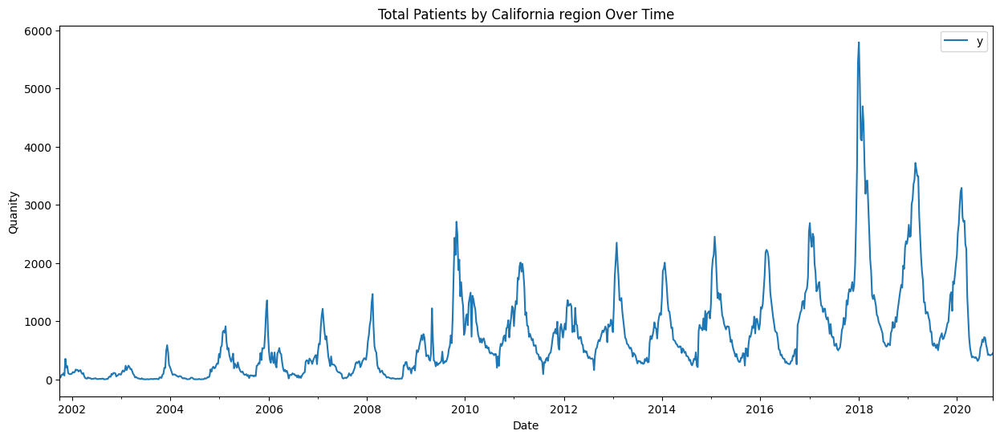

In [139]:
# visualize the California data
ax = df_california.set_index('ds').plot(figsize=(15, 6))
ax.title.set_text('Total Patients by California region Over Time')
ax.set_ylabel('Quanity')
ax.set_xlabel('Date')

plt.show()

In [140]:
def accuracy(obs, pred):
    """
    Calculate accuracy measures

    :param obs: pd.Series of observed values
    :param pred: pd.Series of forecasted values
    :return: dict with accuracy measures
    """

    obs, pred = np.array(obs.dropna()), np.array(pred.dropna())

    assert len(obs) == len(pred), f'accuracy(): obs len is {len(obs)} but preds len is {len(pred)}'

    rmse = np.sqrt(np.mean((obs - pred)**2))
    mape = np.mean(np.abs((obs - pred) / obs))

    return (rmse, mape)

In [141]:
# base code from docs on NeuralProphet
def fit_neural(df, params=None):
    """
    FIt NeuralProphet and return key objects.
    """

    # fit
    m = NeuralProphet(**params) if params is not None else NeuralProphet()
    metrics = m.fit(df, freq="D")

    df_future = m.make_future_dataframe(df, periods=365)
    forecast = m.predict(df_future, raw=True, decompose=False) if params is not None else m.predict(df_future)

    if params is None:
        fig_forecast = m.plot(forecast)
        fig_components = m.plot_components(forecast)
        fig_params = m.plot_parameters()

        return (m, forecast, fig_forecast, fig_components, fig_params)

    else:
        return (None, forecast, None, None)

In [142]:
def eval_neural(df):
    """
    Perform cross validation on our model.
    IMPORTANT: this is correct eval method according to the docs, but differs from Prophet
               so I built a custom function.
    """

    # setup k fold CV
    METRICS = ['SmoothL1Loss', 'MAE', 'RMSE']

    folds = NeuralProphet().crossvalidation_split_df(df, freq="D", k=5, fold_pct=0.20, fold_overlap_pct=0.5)

    # return dfs
    metrics_train = pd.DataFrame(columns=METRICS)
    metrics_test = pd.DataFrame(columns=METRICS)

    # CV
    for df_train, df_test in folds:
        m = NeuralProphet()
        train = m.fit(df=df_train, freq="D")
        test = m.test(df=df_test)
        metrics_train = metrics_train.append(train[METRICS].iloc[-1])
        metrics_test = metrics_test.append(test[METRICS].iloc[-1])

    return (metrics_train, metrics_test)

In [143]:
def cv_run_both_models(df, neural_params):
    """
    Create a CV dataset and run both models and return accuracies. Note that both models
    have their own eval methods, but they differ so I built a custom func that does the
    same thing.

    :param df: pd.DataFrame of Prophet-specified format
    :param neural_params: dict of params to be passed to NeuralProphet
    :return: tuple of training accuracies
    """

    # create train test splits (test = 365 days, train = all prior data, increment = 180 days)
    train_test_split_indices = list(range(365*2, len(df.index) - 365, 180))
    train_test_splits = [(df.iloc[:i, :], df.iloc[i:(i+365), :]) for i in train_test_split_indices]

    rmse_p, mape_p = [], []
    rmse_n, mape_n = [], []
    n_training_days = []

    # loop through train/test splits
    for x in train_test_splits:
        train, test = x
        n_training_days.append(len(train.index))

        # train Prophet and get accuracy
        _, forecast, *_ = fit_prophet(train)
        rmse, mape = accuracy(test['y'], forecast.loc[test['y'].index, 'yhat'])
        rmse_p.append(rmse)
        mape_p.append(mape)

        # train NeuralProphet and get accuracy
        _, forecast, *_ = fit_neural(train, neural_params)
        rmse, mape = accuracy(test['y'], pd.Series(np.array(forecast.iloc[:, 1:]).flatten()))
        rmse_n.append(rmse)
        mape_n.append(mape)

    return pd.DataFrame(dict(
        n_training_days=n_training_days,
        prophet_RMSE=rmse_p,
        neural_RMSE=rmse_n,
        prophet_MAPE=mape_p,
        neural_MAPE=mape_n
    ))

# **IMPLEMENT FB PROPHET MODEL**
Install the required dependencies

In [144]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.diagnostics import performance_metrics, cross_validation

We fit the model by instantiating a new Prophet object. Any settings to the forecasting procedure are passed into the constructor. Then we call its fit method and pass in the historical dataframe. Fitting should take 1-5 seconds.

# **All California Plots**

In [145]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.diagnostics import performance_metrics, cross_validation
import plotly.io as pio

# Set Plotly renderer for Google Colab (or use 'default' for local Jupyter or other environments)
pio.renderers.default = 'colab'

# Initialize Prophet model
m = Prophet()
m.fit(df_california)

# Create future dataframe for predictions
future = m.make_future_dataframe(periods=1000)

# Make predictions
forecast = m.predict(future)

# Generate Plotly plot and add title
fig1 = plot_plotly(m, forecast)
fig1.update_layout(title_text="Prophet Forecast for California", title_x=0.5)
fig1.show()

# Generate components plot and add title
fig2 = plot_components_plotly(m, forecast)
fig2.update_layout(title_text="Prophet Components for California", title_x=0.5)
fig2.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/2shaa5__.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/5uow9z5j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30850', 'data', 'file=/tmp/tmpl41n32w7/2shaa5__.json', 'init=/tmp/tmpl41n32w7/5uow9z5j.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modelcwisoe6d/prophet_model-20240518014047.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:40:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:40:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


The predict method will assign each row in future a predicted value which it names yhat. If we pass in historical dates, it will provide an in-sample fit. The forecast object here is a new dataframe that includes a column yhat with the forecast, as well as columns for components and uncertainty intervals.

In [146]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1986,2023-06-19,1497.999403,918.341581,2057.069442
1987,2023-06-20,1495.589176,937.038844,2092.823322
1988,2023-06-21,1493.002131,936.842478,2057.523369
1989,2023-06-22,1490.225952,916.245199,2054.280099
1990,2023-06-23,1487.255008,913.028058,2050.160553


We plot the forecast by calling the Prophet.plot method and passing in our forecast dataframe.

# **Central Region Plots**

In [147]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.diagnostics import performance_metrics, cross_validation
import plotly.io as pio

# Set Plotly renderer for Google Colab (or use 'default' for local Jupyter or other environments)
pio.renderers.default = 'colab'

# Initialize Prophet model
m = Prophet()
m.fit(df_central)

# Create future dataframe for predictions
future = m.make_future_dataframe(periods=1000)

# Make predictions
forecast = m.predict(future)

# Generate Plotly plot and add title
fig1 = plot_plotly(m, forecast)
fig1.update_layout(title_text="Prophet Forecast for Central Region", title_x=0.5)
fig1.show()

# Generate components plot and add title
fig2 = plot_components_plotly(m, forecast)
fig2.update_layout(title_text="Prophet Components for Central Region", title_x=0.5)
fig2.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/iacj5lza.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/0rof22uz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27635', 'data', 'file=/tmp/tmpl41n32w7/iacj5lza.json', 'init=/tmp/tmpl41n32w7/0rof22uz.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modelpquqcawx/prophet_model-20240518014108.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:41:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:41:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


# **Lower Southern Plots**

In [148]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.diagnostics import performance_metrics, cross_validation
import plotly.io as pio

# Set Plotly renderer for Google Colab (or use 'default' for local Jupyter or other environments)
pio.renderers.default = 'colab'

# Initialize Prophet model
m = Prophet()
m.fit(df_lower_southern)

# Create future dataframe for predictions
future = m.make_future_dataframe(periods=1000)

# Make predictions
forecast = m.predict(future)

# Generate Plotly plot and add title
fig1 = plot_plotly(m, forecast)
fig1.update_layout(title_text="Prophet Forecast for Lower Southern Region", title_x=0.5)
fig1.show()

# Generate components plot and add title
fig2 = plot_components_plotly(m, forecast)
fig2.update_layout(title_text="Prophet Components for Lower Southern Region", title_x=0.5)
fig2.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/fkvussls.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/423qdb__.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45278', 'data', 'file=/tmp/tmpl41n32w7/fkvussls.json', 'init=/tmp/tmpl41n32w7/423qdb__.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_model60ttusb5/prophet_model-20240518014123.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:41:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:41:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


# **Upper Southern Plots**

In [149]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.diagnostics import performance_metrics, cross_validation
import plotly.io as pio

# Set Plotly renderer for Google Colab (or use 'default' for local Jupyter or other environments)
pio.renderers.default = 'colab'

# Initialize Prophet model
m = Prophet()
m.fit(df_upper_southern)

# Create future dataframe for predictions
future = m.make_future_dataframe(periods=1000)

# Make predictions
forecast = m.predict(future)

# Generate Plotly plot and add title
fig1 = plot_plotly(m, forecast)
fig1.update_layout(title_text="Prophet Forecast for Upper Southern Region", title_x=0.5)
fig1.show()

# Generate components plot and add title
fig2 = plot_components_plotly(m, forecast)
fig2.update_layout(title_text="Prophet Components for Upper Southern Region", title_x=0.5)
fig2.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/o997a3oc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/w47lazhc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61506', 'data', 'file=/tmp/tmpl41n32w7/o997a3oc.json', 'init=/tmp/tmpl41n32w7/w47lazhc.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modelgqem5bgp/prophet_model-20240518014136.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:41:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:41:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


# **Northern Plots**

In [150]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.diagnostics import performance_metrics, cross_validation
import plotly.io as pio

# Set Plotly renderer for Google Colab (or use 'default' for local Jupyter or other environments)
pio.renderers.default = 'colab'

# Initialize Prophet model
m = Prophet()
m.fit(df_northern)

# Create future dataframe for predictions
future = m.make_future_dataframe(periods=1000)

# Make predictions
forecast = m.predict(future)

# Generate Plotly plot and add title
fig1 = plot_plotly(m, forecast)
fig1.update_layout(title_text="Prophet Forecast for Northern Region", title_x=0.5)
fig1.show()

# Generate components plot and add title
fig2 = plot_components_plotly(m, forecast)
fig2.update_layout(title_text="Prophet Components for Northern Region", title_x=0.5)
fig2.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/34whng2p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/htpyrqqx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68005', 'data', 'file=/tmp/tmpl41n32w7/34whng2p.json', 'init=/tmp/tmpl41n32w7/htpyrqqx.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modelfsldtjsi/prophet_model-20240518014156.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:41:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:41:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


# **Bay Area Plots**

In [151]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.diagnostics import performance_metrics, cross_validation
import plotly.io as pio

# Set Plotly renderer for Google Colab (or use 'default' for local Jupyter or other environments)
pio.renderers.default = 'colab'

# Initialize Prophet model
m = Prophet()
m.fit(df_bay_area)

# Create future dataframe for predictions
future = m.make_future_dataframe(periods=1000)

# Make predictions
forecast = m.predict(future)

# Generate Plotly plot and add title
fig1 = plot_plotly(m, forecast)
fig1.update_layout(title_text="Prophet Forecast for Bay Area Region", title_x=0.5)
fig1.show()

# Generate components plot and add title
fig2 = plot_components_plotly(m, forecast)
fig2.update_layout(title_text="Prophet Components for Bay Area Region", title_x=0.5)
fig2.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/iwpji27v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/1neug6y7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38999', 'data', 'file=/tmp/tmpl41n32w7/iwpji27v.json', 'init=/tmp/tmpl41n32w7/1neug6y7.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modelv18_7fvd/prophet_model-20240518014207.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:42:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:42:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


# **Evaluation and Retrieve the Error Metrics from FB Prophet model**
1. Split the data into training and testing sets
2. Fit the models
3. Make predictions on the test set
4. Compute MAE, MSE, and RMSE

In [153]:
# Import necessary libraries
import pandas as pd
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format
df['weekending'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')

# List of regions
regions = df['region'].unique()

# Dictionary to store error metrics for each region
error_metrics = {}

# Iterate over each region
for region in regions:
    print(f"Processing region: {region}")

    # Filter data for the region
    df_region = df[df['region'] == region][['weekending', 'Total_ILI']].rename(columns={'weekending': 'ds', 'Total_ILI': 'y'})

    # Split data into training and test sets
    train_size = int(len(df_region) * 0.8)
    train_df = df_region[:train_size]
    test_df = df_region[train_size:]

    # Initialize Prophet model
    model = Prophet()

    # Fit the model on the training data
    model.fit(train_df)

    # Make future dataframe for forecasting
    future = model.make_future_dataframe(periods=len(test_df))

    # Make predictions
    forecast = model.predict(future)

    # Calculate error metrics on the test set
    y_true = test_df['y'].values
    y_pred = forecast['yhat'].iloc[-len(test_df):].values

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    # Store error metrics in the dictionary
    error_metrics[region] = {'MAE': mae, 'MSE': mse, 'RMSE': rmse}

# Convert error metrics dictionary to DataFrame for better visualization
error_metrics_df = pd.DataFrame.from_dict(error_metrics, orient='index').reset_index().rename(columns={'index': 'Region'})

# Display the error metrics
print("FB Prophet Error Metric")
print(error_metrics_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/02rwd8el.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/fv9lt9nv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20574', 'data', 'file=/tmp/tmpl41n32w7/02rwd8el.json', 'init=/tmp/tmpl41n32w7/fv9lt9nv.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modelx5kxzr75/prophet_model-20240518014308.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:43:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:43:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Processing region: Bay Area


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/y0g03lrh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/o_ye26e9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24380', 'data', 'file=/tmp/tmpl41n32w7/y0g03lrh.json', 'init=/tmp/tmpl41n32w7/o_ye26e9.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modele7ew9hp_/prophet_model-20240518014308.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:43:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:43:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Processing region: California


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/eisry2lg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/ejn7xdqa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11243', 'data', 'file=/tmp/tmpl41n32w7/eisry2lg.json', 'init=/tmp/tmpl41n32w7/ejn7xdqa.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modelpbj7mtw0/prophet_model-20240518014309.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:43:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:43:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Processing region: Central


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/73bzvem8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/ljj76hyw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14901', 'data', 'file=/tmp/tmpl41n32w7/73bzvem8.json', 'init=/tmp/tmpl41n32w7/ljj76hyw.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modelrl6qn5tw/prophet_model-20240518014309.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:43:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:43:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Processing region: Lower Southern


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/6icrodok.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/0pzjjzpa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18844', 'data', 'file=/tmp/tmpl41n32w7/6icrodok.json', 'init=/tmp/tmpl41n32w7/0pzjjzpa.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_modelv9sfufsr/prophet_model-20240518014310.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:43:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


Processing region: Northern


01:43:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/46qrd5_n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpl41n32w7/62zke7ah.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39144', 'data', 'file=/tmp/tmpl41n32w7/46qrd5_n.json', 'init=/tmp/tmpl41n32w7/62zke7ah.json', 'output', 'file=/tmp/tmpl41n32w7/prophet_model_gpo6ick/prophet_model-20240518014310.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
01:43:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
01:43:11 - cmdstanpy - INFO - Chain [1] 

Processing region: Upper Southern
FB Prophet Error Metric
           Region         MAE           MSE         RMSE
0        Bay Area  218.172506  7.950090e+04   281.959048
1      California  750.272384  1.232013e+06  1109.961022
2         Central  130.866642  2.037291e+04   142.733700
3  Lower Southern  317.424792  2.933757e+05   541.641703
4        Northern  225.113821  9.958849e+04   315.576439
5  Upper Southern   42.979816  3.133539e+03    55.978026


# **Results from Error Metrics for all three models**

In [64]:
# SARIMA Error Metrics
#            Region         MAE           MSE         RMSE
# 0        Bay Area  263.300648  1.137641e+05   337.289298
# 1      California  810.607284  1.219914e+06  1104.497247
# 2         Central   71.463836  7.973070e+03    89.292046
# 3  Lower Southern  318.253570  1.937494e+05   440.169694
# 4        Northern  198.461363  8.850728e+04   297.501738
# 5  Upper Southern   32.398326  2.476399e+03    49.763434
#
# FB Prophet Error Metric
#            Region         MAE           MSE         RMSE
# 0        Bay Area  218.172506  7.950090e+04   281.959048
# 1      California  750.272384  1.232013e+06  1109.961022
# 2         Central  130.866642  2.037291e+04   142.733700
# 3  Lower Southern  317.424792  2.933757e+05   541.641703
# 4        Northern  225.113821  9.958849e+04   315.576439
# 5  Upper Southern   42.979816  3.133539e+03    55.978026
#
# Neural Prophet Error Metrics
#            Region         MAE            MSE        RMSE
# 0        Bay Area  130.292672   32096.392930  179.154662
# 1      California  509.900221  657707.003228  810.991371
# 2         Central   57.754576    7773.989801   88.170232
# 3  Lower Southern  267.787888  214211.741417  462.830143
# 4        Northern  134.122470   38380.800050  195.910184
# 5  Upper Southern   14.259829     550.880529   23.470844

# *Based on the MAE, MSE, and RMSE: The best performance model is Neural Prophet*

# **VISUALIZE PLOTS FROM NEURAL PROPHET MODEL**

In [65]:
!pip install neuralprophet plotly

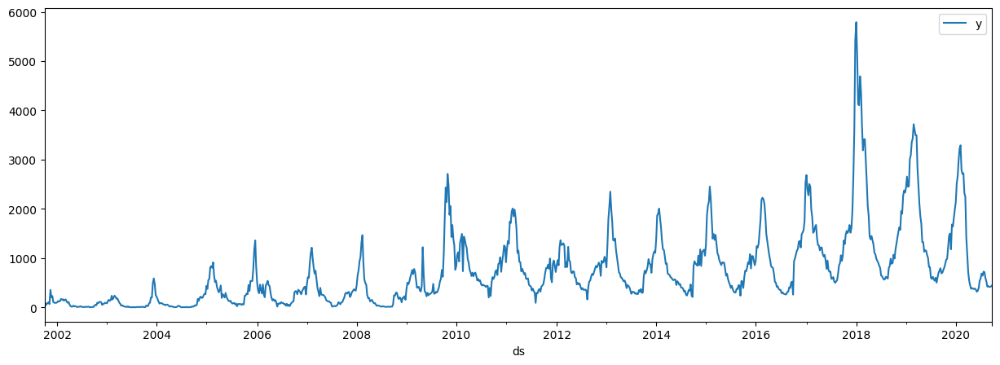

In [154]:
# Load the dataset from the CSV file using pandas
#df = pd.read_csv("...")
# Plot the dataset, showing price (y column) over time (ds column)
plt = df_california.plot(x="ds", y="y", figsize=(15, 5))

Note: Whenever we use a dataset with NeuralProphet, it must be a pandas dataframe with the following format and properties:

Time series column must be named "ds" and contain datetime values.
Value column must be named "y" and contain float values.

# Set up the model

In [155]:
# Import the NeuralProphet class
from neuralprophet import NeuralProphet, set_log_level

# Disable logging messages unless there is an error
set_log_level("ERROR")

# Create a NeuralProphet model with default parameters
m = NeuralProphet()
# Use static plotly in notebooks
m.set_plotting_backend("plotly-static")

# Fit the model on the dataset (this might take a bit)
metrics = m.fit(df_california)

Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

# Forecast the future
To predict future values we have to extend our dataframe. In our California df we want to create a forecast of the next year (meaning 365 days). Then we have to run the prediction again on the extended dataframe.

In [172]:
# Install kaleido
!pip install -U kaleido plotly

In [178]:
# Create a new dataframe reaching 204 (4 years) into the future for our forecast, n_historic_predictions also shows historic data
df_future_california = m.make_future_dataframe(df_california, n_historic_predictions=True, periods=208)

# Predict the future
forecast = m.predict(df_future_california)

Predicting: 31it [00:00, ?it/s]

In [179]:
# Visualize the forecast
m.plot(forecast)

In [188]:
# Create a new dataframe reaching 208 (4 years) into the future for our forecast, n_historic_predictions also shows historic data
df_future_bay_area = m.make_future_dataframe(df_bay_area, n_historic_predictions=True, periods=208)

# Predict the future
forecast_bay_area = m.predict(df_future_bay_area)

Predicting: 31it [00:00, ?it/s]

In [189]:
m.plot(forecast_bay_area)

In [193]:
# Create a new dataframe reaching 208 (4 years) into the future for our forecast, n_historic_predictions also shows historic data
df_future_northern = m.make_future_dataframe(df_northern, n_historic_predictions=True, periods=208)

# Predict the future
forecast_northern = m.predict(df_future_northern)

Predicting: 31it [00:00, ?it/s]

In [194]:
m.plot(forecast_northern)

In [183]:
# NeuralProphet // forecast for California
import pandas as pd
from neuralprophet import NeuralProphet
import plotly.graph_objs as go
import plotly.io as pio

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format and filter for California region
df['ds'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')
df = df[df['region'] == 'California'][['ds', 'Total_ILI']].rename(columns={'Total_ILI': 'y'})

# Initialize NeuralProphet model
m = NeuralProphet()

# Fit the model on the dataset
metrics = m.fit(df, freq='W')

# Create future dataframe and make predictions
future = m.make_future_dataframe(df, periods=208)
forecast = m.predict(future)

# Check the forecast dataframe columns
print(forecast.columns)

# Create custom Plotly plot
fig = go.Figure()

# Add original data to the plot
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Original Data'))

# Add forecast data to the plot
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat1'], mode='lines', name='Forecast'))

# Add confidence intervals to the plot if available
if 'yhat1_upper' in forecast.columns and 'yhat1_lower' in forecast.columns:
    fig.add_trace(go.Scatter(
        x=forecast['ds'],
        y=forecast['yhat1_upper'],
        mode='lines',
        name='Upper Confidence Interval',
        line=dict(width=0),
        showlegend=False
    ))
    fig.add_trace(go.Scatter(
        x=forecast['ds'],
        y=forecast['yhat1_lower'],
        mode='lines',
        name='Lower Confidence Interval',
        line=dict(width=0),
        fill='tonexty',
        fillcolor='rgba(0,100,80,0.2)',
        showlegend=False
    ))


Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Index(['ds', 'y', 'yhat1', 'trend', 'season_yearly'], dtype='object')


In [184]:
# Visualize the plot
fig.update_layout(
    title="NeuralProphet Forecast for California Region",
    title_x=0.5,
    xaxis_title='Date',
    yaxis_title='Total ILI'
)

# Show the plot
fig.show()

In [185]:
# NeuralProphet // forecast for Bay Area region
import pandas as pd
from neuralprophet import NeuralProphet
import plotly.graph_objs as go
import plotly.io as pio

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format and filter for Bay Area region
df['ds'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')
df = df[df['region'] == 'Bay Area'][['ds', 'Total_ILI']].rename(columns={'Total_ILI': 'y'})

# Initialize NeuralProphet model
m = NeuralProphet()

# Fit the model on the dataset
metrics = m.fit(df, freq='W')

# Create future dataframe and make predictions
future = m.make_future_dataframe(df, periods=208)
forecast = m.predict(future)

# Check the forecast dataframe columns
print(forecast.columns)

# Create custom Plotly plot
fig = go.Figure()

# Add original data to the plot
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Original Data'))

# Add forecast data to the plot
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat1'], mode='lines', name='Forecast'))

# Add confidence intervals to the plot if available
if 'yhat1_upper' in forecast.columns and 'yhat1_lower' in forecast.columns:
    fig.add_trace(go.Scatter(
        x=forecast['ds'],
        y=forecast['yhat1_upper'],
        mode='lines',
        name='Upper Confidence Interval',
        line=dict(width=0),
        showlegend=False
    ))
    fig.add_trace(go.Scatter(
        x=forecast['ds'],
        y=forecast['yhat1_lower'],
        mode='lines',
        name='Lower Confidence Interval',
        line=dict(width=0),
        fill='tonexty',
        fillcolor='rgba(0,100,80,0.2)',
        showlegend=False
    ))

Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Index(['ds', 'y', 'yhat1', 'trend', 'season_yearly'], dtype='object')


In [187]:
# Visualize the plot
fig.update_layout(
    title="NeuralProphet Forecast for Bay Area Region",
    title_x=0.5,
    xaxis_title='Date',
    yaxis_title='Total ILI'
)

# Show the plot
fig.show()

In [190]:
# NeuralProphet // forecast for Northern region
import pandas as pd
from neuralprophet import NeuralProphet
import plotly.graph_objs as go
import plotly.io as pio

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/data/flu-ili-byregion-fluseason_data.csv')

# Convert weekending to datetime format and filter for Northern region
df['ds'] = pd.to_datetime(df['weekending'], format='%m/%d/%y')
df = df[df['region'] == 'Northern'][['ds', 'Total_ILI']].rename(columns={'Total_ILI': 'y'})

# Initialize NeuralProphet model
m = NeuralProphet()

# Fit the model on the dataset
metrics = m.fit(df, freq='W')

# Create future dataframe and make predictions
future = m.make_future_dataframe(df, periods=208)
forecast = m.predict(future)

# Check the forecast dataframe columns
print(forecast.columns)

# Create custom Plotly plot
fig = go.Figure()

# Add original data to the plot
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Original Data'))

# Add forecast data to the plot
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat1'], mode='lines', name='Forecast'))

# Add confidence intervals to the plot if available
if 'yhat1_upper' in forecast.columns and 'yhat1_lower' in forecast.columns:
    fig.add_trace(go.Scatter(
        x=forecast['ds'],
        y=forecast['yhat1_upper'],
        mode='lines',
        name='Upper Confidence Interval',
        line=dict(width=0),
        showlegend=False
    ))
    fig.add_trace(go.Scatter(
        x=forecast['ds'],
        y=forecast['yhat1_lower'],
        mode='lines',
        name='Lower Confidence Interval',
        line=dict(width=0),
        fill='tonexty',
        fillcolor='rgba(0,100,80,0.2)',
        showlegend=False
    ))

Finding best initial lr:   0%|          | 0/225 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 31it [00:00, ?it/s]

Index(['ds', 'y', 'yhat1', 'trend', 'season_yearly'], dtype='object')


In [192]:
# Visualize the plot for Northern region
fig.update_layout(
    title="NeuralProphet Forecast for Northern region",
    title_x=0.5,
    xaxis_title='Date',
    yaxis_title='Total ILI'
)

# Show the plot
fig.show()